# Backend

In [1]:
#import necessary libraries
import xarray as xr
from netCDF4 import Dataset, MFDataset, num2date
import cartopy.crs as ccrs
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from pyproj import Proj
import geopandas as gpd

In [2]:
#counties shapefile
import cartopy.io.shapereader as shpreader
import cartopy.feature as cfeature
reader = shpreader.Reader('counties/countyl010g.shp')
counties = list(reader.geometries())
COUNTIES = cfeature.ShapelyFeature(counties, ccrs.PlateCarree())

In [3]:
#rwc_2020 = xr.open_dataset('rwc_2020_201601_avg.nc')
rwc_2016 = xr.open_dataset('2016_01_merged_diff_no_rwc.nc')
#rwc_2016_primary = xr.open_dataset('2016_01_difference_no_primary_rwc.nc')
rwc_2020_new_surg =  xr.open_dataset('2020_new_surrogates_avg.nc')
#rwc_2020_primary = xr.open_dataset('rwc_2020_primary_avg.nc')

In [4]:
total_avg = xr.open_dataset('baseline_CONUS4K.nc', drop_variables=['COL','ROW'])

In [5]:
def add_pm25(dataset):
    # Extract variables representing PM2.5 components
    pm25_components = ['PAL', 'PCA', 'PCL', 'PEC', 'PFE', 'PH2O', 'PK', 'PMG', 'PMN', 'PMOTHR', 'PNA', 'PNCOM', 'PNH4', 'PNO3', 'POC', 'PSI', 'PSO4', 'PTI']
    pm25_concentrations = dataset[pm25_components]

    # Sum up the concentrations along the specified dimensions (if necessary)
    # Access the variables you want to sum
    #PSO4', 'PNO3', 'POC', 'PEC', 'PNH4',
    pm25_total =  pm25_concentrations.variables[pm25_components[0]]
    for component in pm25_components[1:]:
        pm25_total += pm25_concentrations.variables[component]
        
    # Sum the emissions for each grid cell across the variables
    #pm25_total = var1+ var2 + var3 + var4 + var5

    # # Create a new variable for PM2.5 total and assign the calculated values to it
    dataset['PM25_total'] = pm25_total

    # Optionally, you can add attributes to the new variable to provide metadata
    dataset['PM25_total'].attrs['long_name'] = 'PM25_total'
    dataset['PM25_total'].attrs['units'] = 'g/s'
    dataset['PM25_total'].attrs['var_desc'] = 'Total PM2.5 concentration'
    return dataset

In [6]:
#rwc_2020 = add_pm25(rwc_2020)
rwc_2016 = add_pm25(rwc_2016)
rwc_2020_new_surg = add_pm25(rwc_2020_new_surg)
# rwc_2020_primary = add_pm25(rwc_2020_primary)
# rwc_2016_primary = add_pm25(rwc_2016_primary)
# total = add_pm25(total_avg)

In [7]:
import geopandas as gpd
from shapely.geometry import Polygon
import numpy as np

# Projection parameters
proj_params = {'proj': 'lcc',
               'lat_1': 33,
               'lat_2': 45,
               'lon_0': -97,
               'lat_0': 40}

# Coordinates of the origin
xorig = -2292000
yorig = -1584000

# Number of grid cells in x and y directions
num_cells_x = 1155
num_cells_y = 726

# Size of each grid cell (in meters)
cell_size = 4000  # 4km

# Generate grid coordinates using NumPy
x_coords = np.linspace(xorig, xorig + cell_size * num_cells_x, num_cells_x + 1)
y_coords = np.linspace(yorig, yorig + cell_size * num_cells_y, num_cells_y + 1)

# Create vertices for all grid cells using NumPy
x1, y1 = np.meshgrid(x_coords[:-1], y_coords[:-1])
x2, y2 = np.meshgrid(x_coords[1:], y_coords[:-1])
x3, y3 = np.meshgrid(x_coords[1:], y_coords[1:])
x4, y4 = np.meshgrid(x_coords[:-1], y_coords[1:])

# Reshape to 1D arrays
x1, x2, x3, x4 = x1.ravel(), x2.ravel(), x3.ravel(), x4.ravel()
y1, y2, y3, y4 = y1.ravel(), y2.ravel(), y3.ravel(), y4.ravel()

# Create GeoDataFrame with polygons
polygons = [Polygon([(x1[i], y1[i]), (x2[i], y2[i]), (x3[i], y3[i]), (x4[i], y4[i])]) for i in range(len(x1))]
pmgdf = gpd.GeoDataFrame(geometry=polygons, crs=proj_params)

In [16]:
# Define the Lambert Conformal Conic projection parameters
proj_params = {'proj': 'lcc',
               'lat_1': 33,
               'lat_2': 45,
               'lon_0': -97,
               'lat_0': 40}


# Define the projection transformation
lcc_proj = Proj(proj_params)

# Define the grid indices
xorig, yorig = -2292000, -1584000  # Coordinates of the origin
xcell, ycell = 4000, 4000  # Size of grid cells
ncols, nrows = 1155, 726  # Number of columns and rows

# Generate grid points
x = np.arange(xorig, xorig + xcell * ncols, xcell)
y = np.arange(yorig, yorig + ycell * nrows, ycell)

# Create a meshgrid from the grid points
x_mesh, y_mesh = np.meshgrid(x, y)

# Convert grid indices to latitude and longitude using the projection
lon, lat = lcc_proj(x_mesh, y_mesh, inverse=True)

In [9]:
pmgdf['PM25_2020_new'] = rwc_2020_new_surg['PM25_total'][0,0,:,:].to_numpy().flatten()
#pmgdf['PM25_2020'] = rwc_2020['PM25_total'][0,0,:,:].to_numpy().flatten()
pmgdf['PM25_2016'] = rwc_2016['PM25_total'][0,0,:,:].to_numpy().flatten()
#pmgdf['PM25_total'] = total['PM25_total'][0,0,:,:].to_numpy().flatten()

# for col in ['PM25_2020_new',
#             'PM25_2020',
#             'PM25_2016',
#             'PM25_total']:
#     pmgdf[col + "_percent"] = 100 * pmgdf[col]/(pmgdf['PM25_total'] + 0.0000000000001)

pmgdf['centroid'] = pmgdf.geometry.centroid

# MSA data
cbsa = gpd.read_file('../WRF_analyses/cbsa/tl_2019_us_cbsa.shp')

# Convert the GeoDataFrame to the target CRS
cbsa = cbsa.to_crs("+proj=lcc +lat_1=33 +lat_2=45 +lon_0=-97 +lat_0=40")

# Create a new GeoDataFrame with centroids
pmgdf_centroids = gpd.GeoDataFrame(geometry=pmgdf['centroid'], crs=pmgdf.crs)
pmgdf_centroids.to_crs(cbsa.crs)

# Perform spatial join based on centroids within cbsa geometry
merged_gdf = gpd.sjoin(pmgdf_centroids, cbsa, op='within')

# add to pm geodataframe
pmgdf['CBSA'] = merged_gdf['NAME']
pmgdf['CBSAFP'] =  merged_gdf['CBSAFP']

/home/ksz4578/.conda/envs/WRF/lib/python3.10/site-packages/IPython/core/interactiveshell.py:3517: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  if await self.run_code(code, result, async_=asy):


### VOC THINGS

In [33]:
def add_new_VOCs(dataset):
    if "VOC_new" in dataset.data_vars:
        dataset = dataset.drop_vars(["VOC_new"])
    
    # Extract variables representing VOC components
    VOC_components = ['AACD', 'APIN', 'FACD', 'GLY', 'GLYD', 'ISPD', 'IVOC', 'MGLY', 'PACD']
    VOC_concentrations = dataset[VOC_components]

    #PSO4', 'PNO3', 'POC', 'PEC', 'PNH4',
    VOC_total =  VOC_concentrations.variables[VOC_components[1]]
    for component in VOC_components[1:]:
        VOC_total += VOC_concentrations.variables[component]
        
    # Sum the emissions for each grid cell across the variables
    #pm25_total = var1+ var2 + var3 + var4 + var5

    # # Create a new variable for PM2.5 total and assign the calculated values to it
    dataset['VOC_new'] = VOC_total

    # Optionally, you can add attributes to the new variable to provide metadata
    dataset['VOC_new'].attrs['long_name'] = 'VOC_new'
    dataset['VOC_new'].attrs['units'] = 'moles/s'
    dataset['VOC_new'].attrs['var_desc'] = 'New Vars VOC concentration'
    return dataset

In [34]:
def add_VOCs(dataset, _2016 = False):
    # Extract variables representing VOC components
    if not _2016:
        VOC_components = ["AACD", "ACET", "ALD2", "ALDX", "APIN", "BENZ", "CH4", "ETH", "ETHA", "ETHY", "ETOH", "FACD", "FORM", "GLY", "GLYD", "ISOP", "ISPD", "IVOC", "KET", "MEOH", "MGLY", "NAPH", "NVOL", "OLE", "PACD", "PAR", "PRPA", "SOAALK", "TERP", "TOL", "UNR", "XYLMN"]
    else:
        VOC_components = ["ACET", "ALD2", "ALDX", "BENZ", "CH4", "ETH", "ETHA", "ETHY", "ETOH", "FORM", "ISOP",  "KET", "MEOH", "NAPH", "NVOL", "OLE", "PAR", "PRPA", "SOAALK", "TERP", "TOL", "UNR", "XYLMN"]

    VOC_concentrations = dataset[VOC_components]

    #PSO4', 'PNO3', 'POC', 'PEC', 'PNH4',
    VOC_total =  VOC_concentrations.variables[VOC_components[0]]
    for component in VOC_components[1:]:
        VOC_total += VOC_concentrations.variables[component]
        
    # Sum the emissions for each grid cell across the variables
    #pm25_total = var1+ var2 + var3 + var4 + var5

    # # Create a new variable for PM2.5 total and assign the calculated values to it
    dataset['VOC_total'] = VOC_total

    # Optionally, you can add attributes to the new variable to provide metadata
    dataset['VOC_total'].attrs['long_name'] = 'VOC_total'
    dataset['VOC_total'].attrs['units'] = 'moles/s'
    dataset['VOC_total'].attrs['var_desc'] = 'Total VOC concentration'
    return dataset

In [ ]:
rwc_2020_new_surg = add_VOCs(rwc_2020_new_surg)
rwc_2020_new_surg = add_new_VOCs(rwc_2020_new_surg)

In [37]:
rwc_2016 =  add_VOCs(rwc_2016, _2016 = True)


In [38]:
rwc_2020 =  add_VOCs(rwc_2020, _2016 = False)
rwc_2020['VOC_total'][0,0,:,:].sum()

<xarray.DataArray 'VOC_total' ()>
array(1225.2556, dtype=float32)

In [39]:
rwc_2016_primary =  add_VOCs(rwc_2016_primary, _2016 = True)
rwc_2016_primary['VOC_total'][0,0,:,:].sum()

<xarray.DataArray 'VOC_total' ()>
array(346.31113, dtype=float32)

In [44]:
rwc_2020_primary =  add_VOCs(rwc_2020_primary, _2016 = False)
rwc_2020_primary['VOC_total'][0,0,:,:].sum()

<xarray.DataArray 'VOC_total' ()>
array(582.77313, dtype=float32)

In [41]:
rwc_2016['VOC_total'][0,0,:,:].sum()

<xarray.DataArray 'VOC_total' ()>
array(1896.272, dtype=float32)

In [42]:
rwc_2020_new_surg['VOC_total'][0,0,:,:].sum()

<xarray.DataArray 'VOC_total' ()>
array(1225.2334, dtype=float32)

In [43]:
rwc_2020_new_surg['VOC_new'][0,0,:,:].sum()

<xarray.DataArray 'VOC_new' ()>
array(95.73344, dtype=float32)

# Plotting 

## US Total PM2.5 Plots

In [32]:
#Challenge #2 change projection type and 
def plot(data, label, title, lat, lon, vs = False, counties = False, bounds = False, difference = False):
    if not bounds:
        bounds = [[0, lat.shape[0]], [0, lon.shape[1]]]
    
    #create matplotlib figure
    plt.figure(figsize=(15,7.2))

    #create subplot with the an Mollweide projection
    ax = plt.subplot(111, projection=ccrs.PlateCarree(central_longitude=-97.0, globe=None))

    #create map with 
    if difference:
            mm = ax.pcolormesh(lon[ bounds[0][0]:bounds[0][1], bounds[1][0]:bounds[1][1] ],
                       lat[ bounds[0][0]:bounds[0][1], bounds[1][0]:bounds[1][1] ],
                       data[ bounds[0][0]:bounds[0][1], bounds[1][0]:bounds[1][1] ],
                       transform=ccrs.PlateCarree(),
                       cmap = "RdBu" #use inferno colormap
                      )
            edge_color = 'black'
            lake_color = "gray"
    else:
            mm = ax.pcolormesh(lon[ bounds[0][0]:bounds[0][1], bounds[1][0]:bounds[1][1] ],
                       lat[ bounds[0][0]:bounds[0][1], bounds[1][0]:bounds[1][1] ],
                       data[ bounds[0][0]:bounds[0][1], bounds[1][0]:bounds[1][1] ],
                       transform=ccrs.PlateCarree(),
                       cmap = "inferno" #use inferno colormap
                      )
            edge_color = 'white'
            lake_color = cfeature.COLORS['water']
    
    #map coastlines on the map with resolution 100m
    ax.coastlines(resolution='110m')

    #generate features
    resol = '10m'  # use data at this scale
    bodr = cfeature.NaturalEarthFeature(category='cultural',  edgecolor = 'black',name='admin_0_boundary_lines_land', scale=resol, facecolor='none', alpha=0.7)
    ocean = cfeature.NaturalEarthFeature('physical', 'ocean', scale=resol, edgecolor='black', facecolor=lake_color)
    lakes = cfeature.NaturalEarthFeature('physical', 'lakes', scale=resol, edgecolor='black', facecolor=lake_color)
    rivers = cfeature.NaturalEarthFeature('physical', 'rivers_lake_centerlines', scale=resol, edgecolor='black', facecolor='none')
    states_provinces = cfeature.NaturalEarthFeature(category='cultural', name='admin_1_states_provinces_lines', scale='50m',edgecolor = 'black', facecolor='none')

    #add features
    ax.add_feature(states_provinces, edgecolor=edge_color, linewidth=0.5)
    ax.add_feature(ocean, linewidth=0.2 )
    if lakes:
        ax.add_feature(lakes, linewidth = 0)
    #ax.add_feature(rivers, linewidth=0.5)
    ax.add_feature(bodr, linestyle='--', edgecolor=edge_color, alpha=1)
    
    if counties:
        ax.add_feature(COUNTIES, facecolor='none', edgecolor='black')

    
    #ax.stock_img(); #land images
    if vs:
        mm.set_clim(vmin=vs[0], vmax=vs[1])
    else:
        mm.set_clim(vmin = np.quantile(data, 0.025), vmax = np.quantile(data, 0.975))

    #plot colorbar legend
    cbar = plt.colorbar(mm)
    cbar.ax.set_ylabel(label,rotation = 90)

    ax.set_title(title)
    ax.set_xlabel('Longitude')
    ax.set_ylabel('Latitude')

## MSA Plotting

In [63]:
# plot MSA data
def plot_MSA(df, MSA, cbsa, title, col = "PM25",cmap = "viridis", vs = False, counties = False, difference = False):
    # Define the target projection
    target_proj = ccrs.LambertConformal(central_longitude=-97, central_latitude=40, standard_parallels=(33, 45))

    #create matplotlib figure
    fig, ax = plt.subplots(figsize=(12,7), subplot_kw={'projection': target_proj}) #subplot_kw={'projection': ccrs.PlateCarree(central_longitude=-97.0, globe=None)})

    cbsa = cbsa.to_crs(target_proj)

    # Get the geometry of the specific MSA (CBSA) by name
    msa_geom = cbsa.loc[cbsa['NAME'] == MSA, 'geometry'].values[0]

    sub_df = df[df.geometry.intersects(msa_geom)]
    # subselect df
    #sub_df = df.loc[df["CBSA"] == MSA]
    
    if vs:
        vmin=vs[0]
        vmax=vs[1]
    else:
        vmin = np.quantile(sub_df[col], 0.025)
        vmax = np.quantile(sub_df[col], 0.975)

    #plot
    mm = sub_df.plot(ax = ax, column = col, cmap=cmap, legend=False, vmin = vmin, vmax = vmax)

    # #generate features
    resol = '50m'  # use data at this scale
    # #bodr = cfeature.NaturalEarthFeature(category='cultural',  edgecolor = 'black',name='admin_0_boundary_lines_land', scale=resol, facecolor='none', alpha=0.7)
    ocean = cfeature.NaturalEarthFeature('physical', 'ocean', scale=resol, edgecolor='black', facecolor=cfeature.COLORS['water'])

    # #lakes = cfeature.NaturalEarthFeature('physical', 'lakes', scale=resol, edgecolor='black', facecolor=cfeature.COLORS['water'])
    # #rivers = cfeature.NaturalEarthFeature('physical', 'rivers_lake_centerlines', scale=resol, edgecolor='black', facecolor='none')
    states_provinces = cfeature.NaturalEarthFeature(category='cultural', name='admin_1_states_provinces_lines', scale='50m',edgecolor = 'black', facecolor='none')

    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['bottom'].set_visible(False)
    ax.spines['left'].set_visible(False)
    ax.set_xticks([])
    ax.set_yticks([])

    # #add features
    if counties:
        ax.add_feature(COUNTIES, facecolor='none', edgecolor='gray')
    ax.add_feature(ocean, linewidth=0.2 )
    #ax.add_feature(states_provinces, edgecolor='black', linewidth=0.5)

    #plot colorbar legend
    #cbar = plt.colorbar(mm)
    #cbar.ax.set_ylabel(label,rotation = 90)

# Plot colorbar legend
    ##bar = plt.colorbar(mm, ax=ax, orientation='vertical')
    #c#bar.ax.tick_params(labelsize=16)  # Change the tick font size
    
    import matplotlib.colors as mcolors
    norm = mcolors.Normalize(vmin=vs[0], vmax=vs[1])
    
    cbar = plt.colorbar(plt.cm.ScalarMappable(cmap='RdBu', norm=norm), ax=ax, orientation='vertical')
    cbar.ax.tick_params(labelsize=16)  # Set the tick label size
    cbar.set_label("PM2.5 Emissions (g/s)", fontsize=16)  # Set label font size

    # Set title font size
    ax.set_title(title, fontsize=18)

    plt.show()

    #return ax

In [57]:
#pmgdf['2020_minus_2016'] = pmgdf['PM25_2020'] -  pmgdf['PM25_2016']
#pmgdf['2020_2016_percent_diff'] = 100 * pmgdf['2020_minus_2016']/pmgdf['PM25_2016']
#pmgdf['2020new_minus_2020'] = pmgdf['PM25_2020_new'] -  pmgdf['PM25_2020']
# pmgdf['2020new_2020_percent_diff'] = 100 * pmgdf['2020new_minus_2020']/pmgdf['PM25_2020']
pmgdf['2020new_minus_2016'] = pmgdf['PM25_2020_new'] -  pmgdf['PM25_2016']
# pmgdf['2020new_2016_percent_diff'] = 100 * pmgdf['2020new_minus_2016']/pmgdf['PM25_2016']

In [58]:
# San Jose, USA 42% heatingseason PM10 (SA) – – Chow et al. (1995)
# https://trid.trb.org/View/425534

#very much underestimated here ~20%, but less understimated in the 2020 version :)
def plot_all(df, MSA, city_name, vs1 = [0,2], vs2 = [-100,100]):
    city_df = plot_MSA(
        df = df,
        MSA = MSA,
        title = f'{city_name} PM2.5 from RWC 2016',
        col = 'PM25_2016',
        cmap = "magma",
        vs = vs1,
        counties = True,
        difference = False
    )

    plot_MSA(
        df = df,
        MSA = MSA,
        title = f'{city_name} PM2.5 from RWC 2020',
        col = "PM25_2020",
        cmap = "magma",
        vs = vs1,
        counties = True,
        difference = False
    )

    plot_MSA(
        df = df,
        MSA = MSA,
        title = f'{city_name} PM2.5 from RWC 2020 new surg',
        col = "PM25_2020_new",
        cmap = "magma",
        vs = vs1,
        counties = True,
        difference = False
    )

    plot_MSA(
        df = df,
        MSA = MSA,
        title = f'{city_name} % Difference in PM2.5 from 2016 to RWC 2020 new surg',
        col = "2020new_2016_percent_diff",
        cmap = "RdBu",
        vs = vs2,
        counties = True,
        difference = False
    )

    plot_MSA(
        df = df,
        MSA = MSA,
        title = f'{city_name} Difference in PM2.5 from 2016 to RWC 2020 new surg',
        col = "2020new_minus_2016",
        cmap = "RdBu",
        vs = [-vs1[1],vs1[1]],
        counties = True,
        difference = False
    )
    print( 100 * (city_df['PM25_2020_new'].sum() - city_df['PM25_2016'].sum())/city_df['PM25_2016'].sum())
    
    return city_df


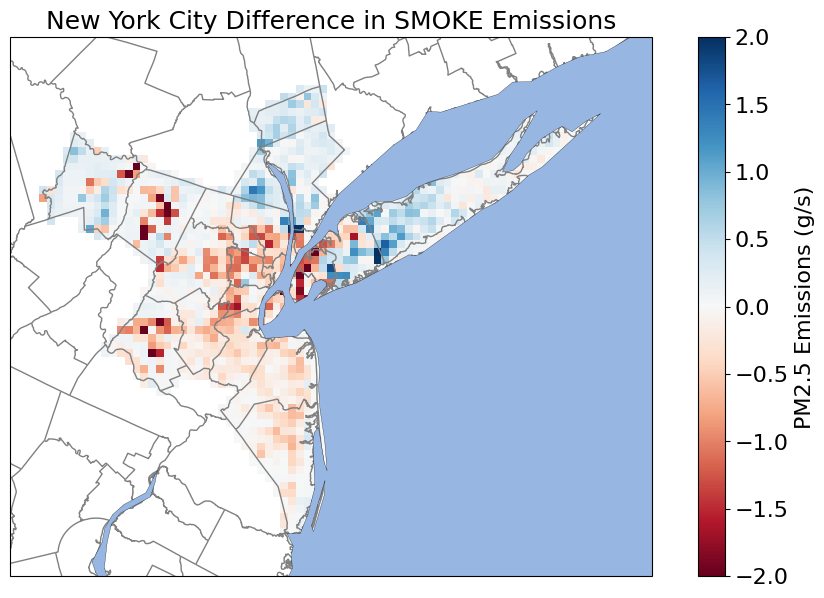

In [64]:
plot_MSA(
        df =  pmgdf,
        cbsa = cbsa,
        MSA = 'New York-Newark-Jersey City, NY-NJ-PA',
        title = 'New York City Difference in SMOKE Emissions',
        col = "2020new_minus_2016",
        cmap = "RdBu",
        vs = [-2, 2],
        counties = True,
        difference = False
    )

-7.084644878403232


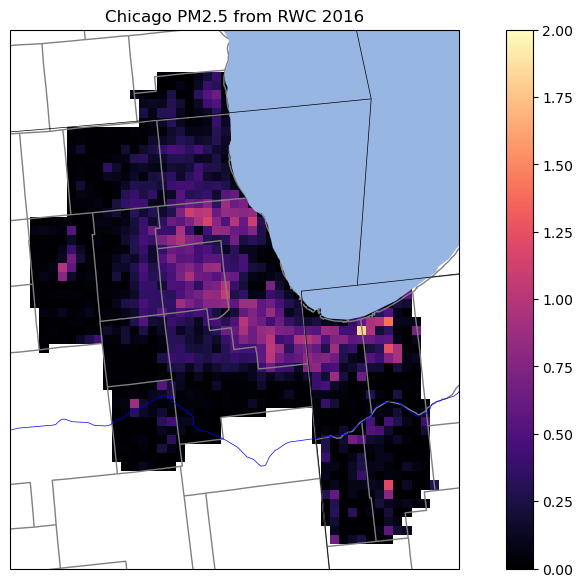

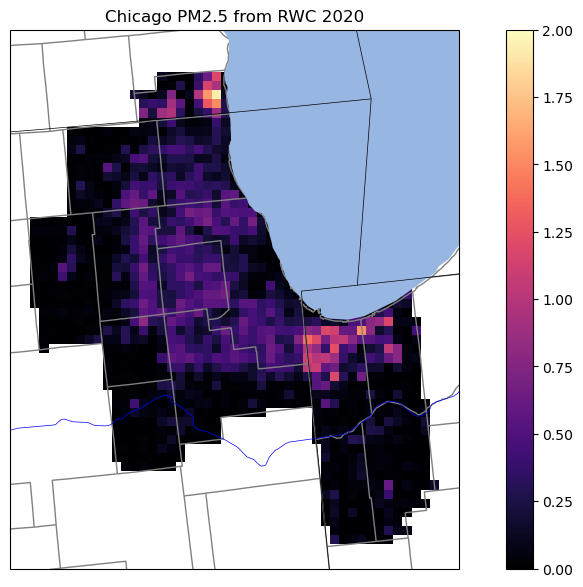

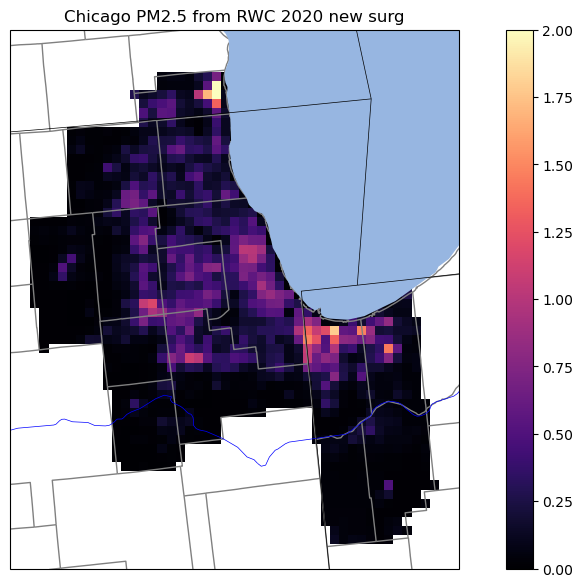

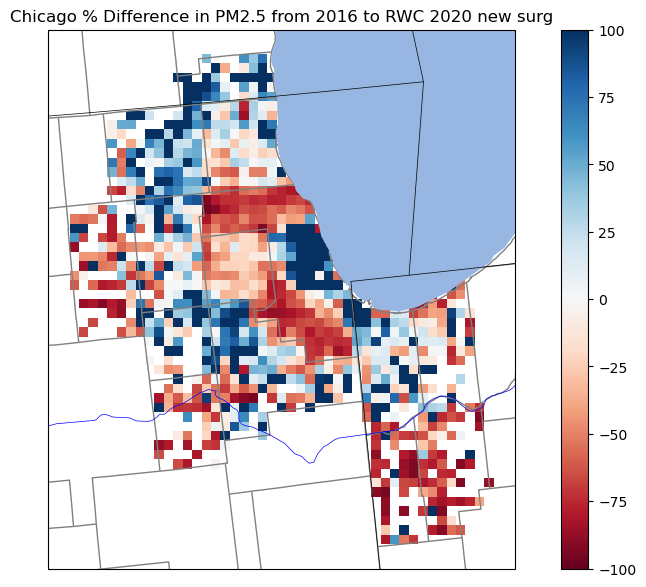

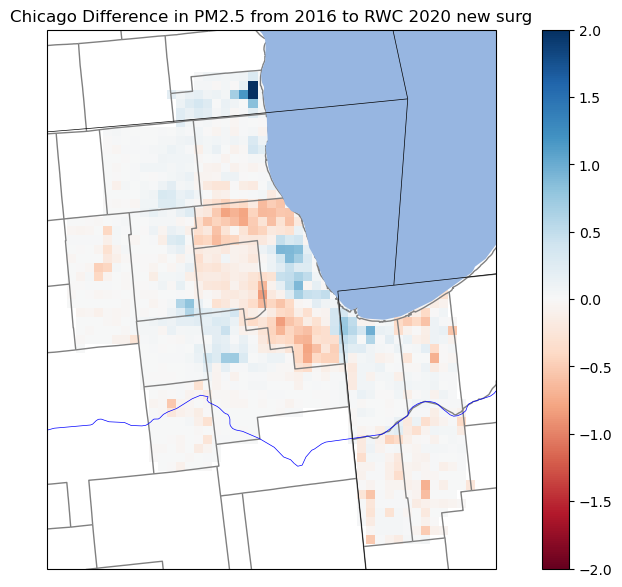

In [51]:
sf_df = plot_all(pmgdf, 'Chicago-Naperville-Elgin, IL-IN-WI', 'Chicago', vs1 = [0,2])

165.00875008104907


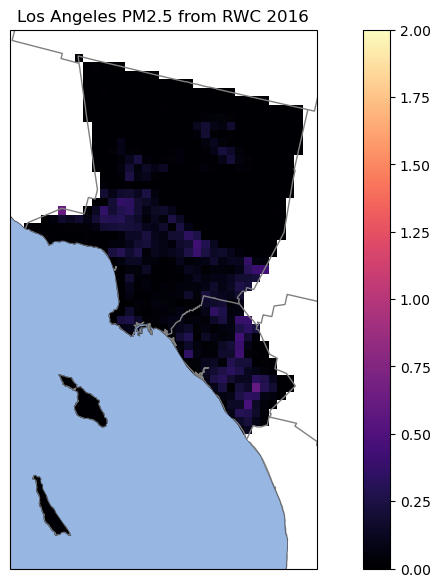

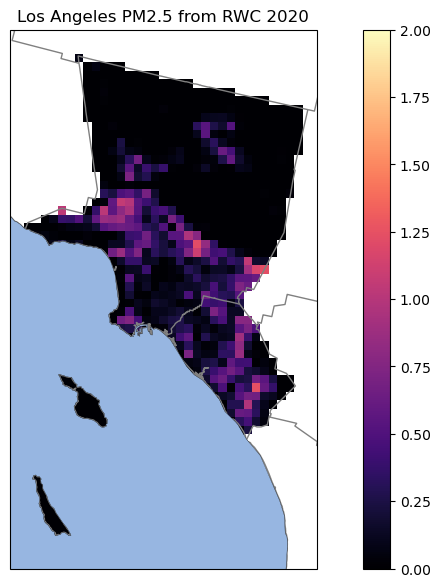

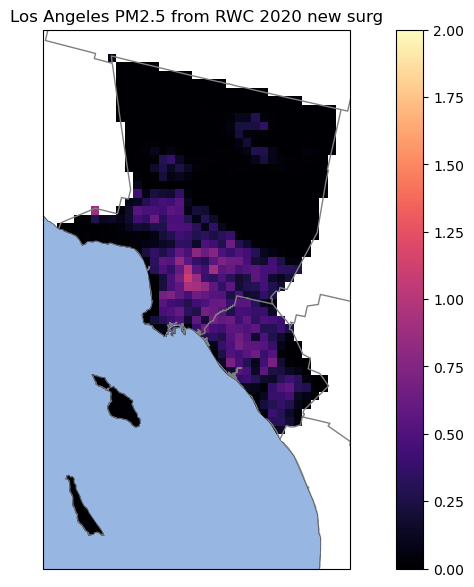

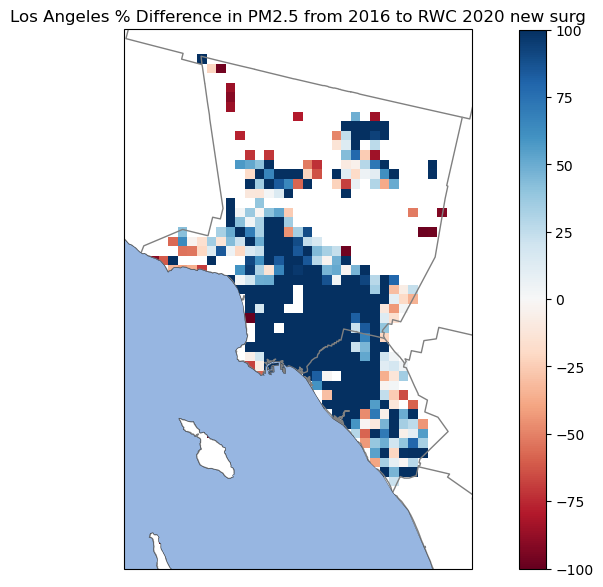

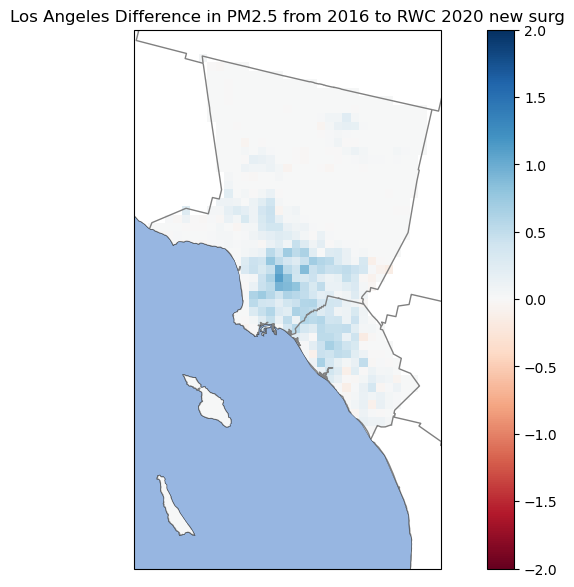

In [12]:
sf_df = plot_all(pmgdf, 'Los Angeles-Long Beach-Anaheim, CA', 'Los Angeles', vs1 = [0,2])

-7.084644878403232


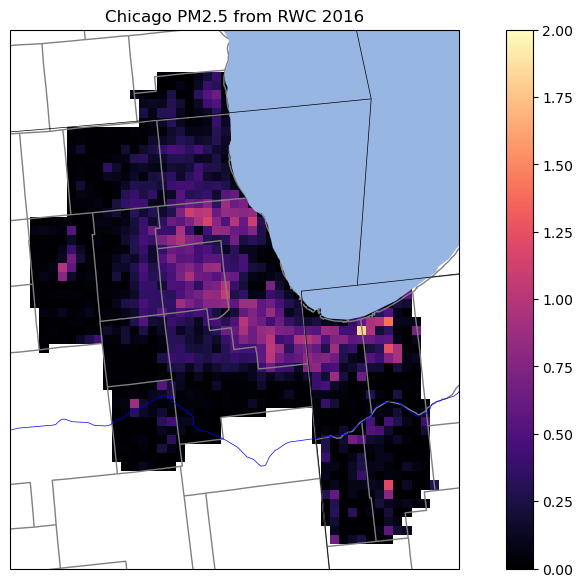

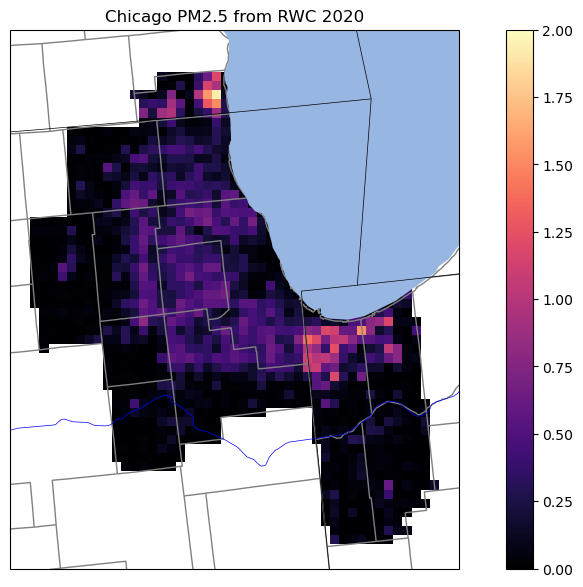

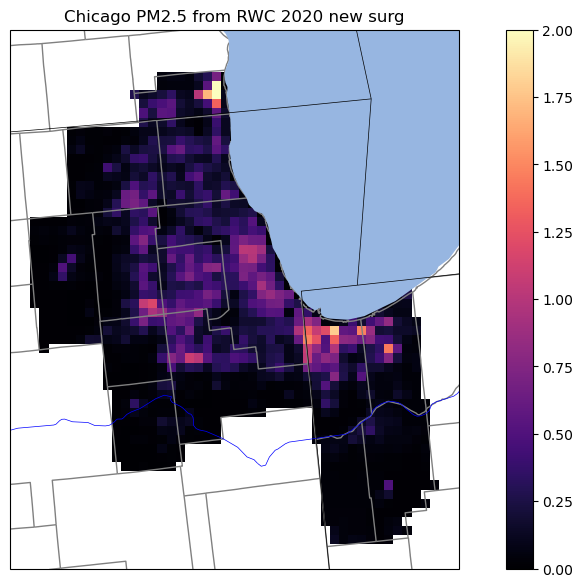

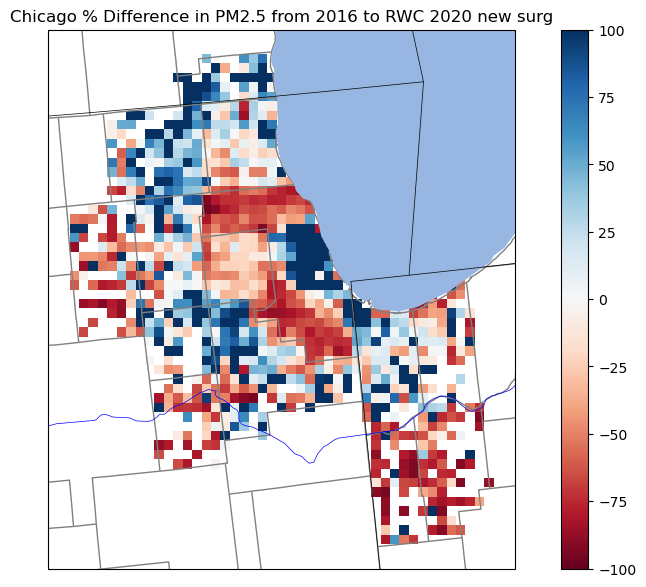

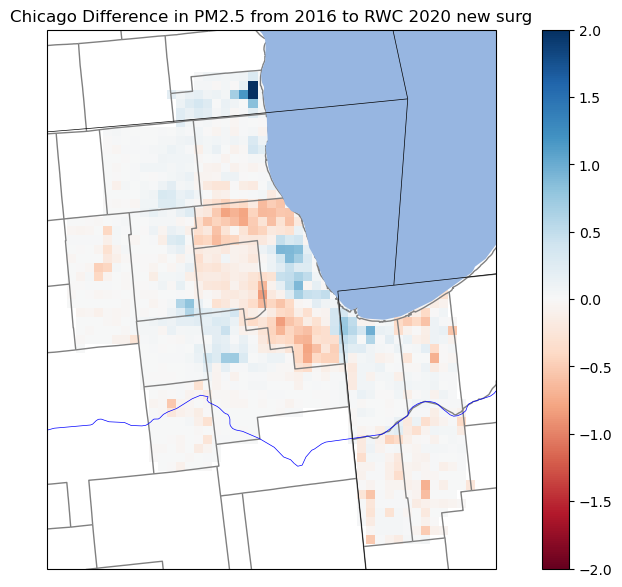

In [27]:
sf_df = plot_all(pmgdf, 'Chicago-Naperville-Elgin, IL-IN-WI', 'Chicago', vs1 = [0,2])

-17.97341805801113


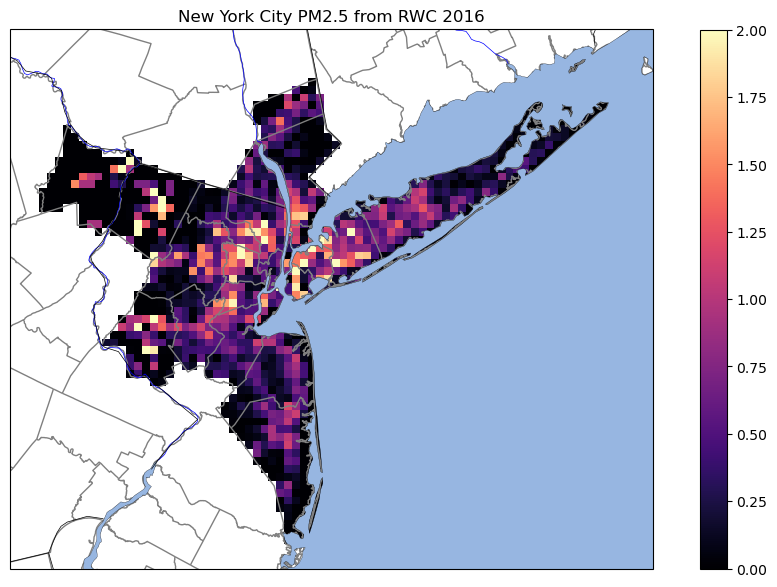

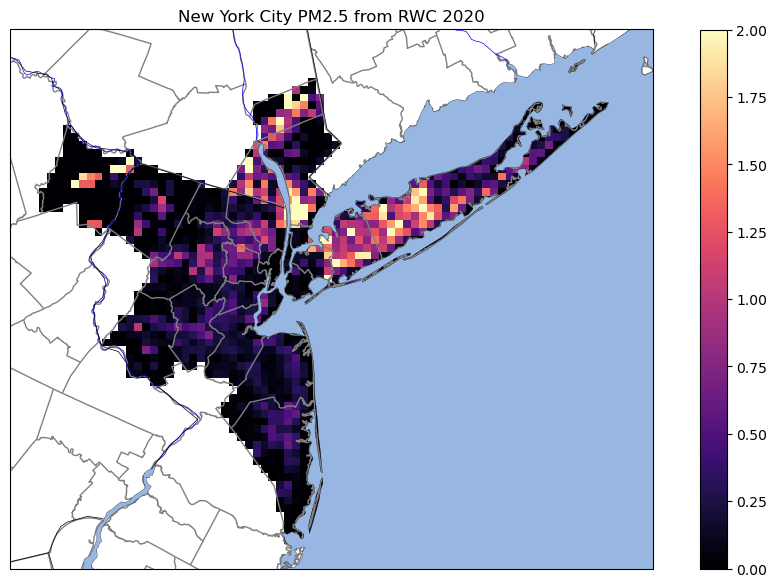

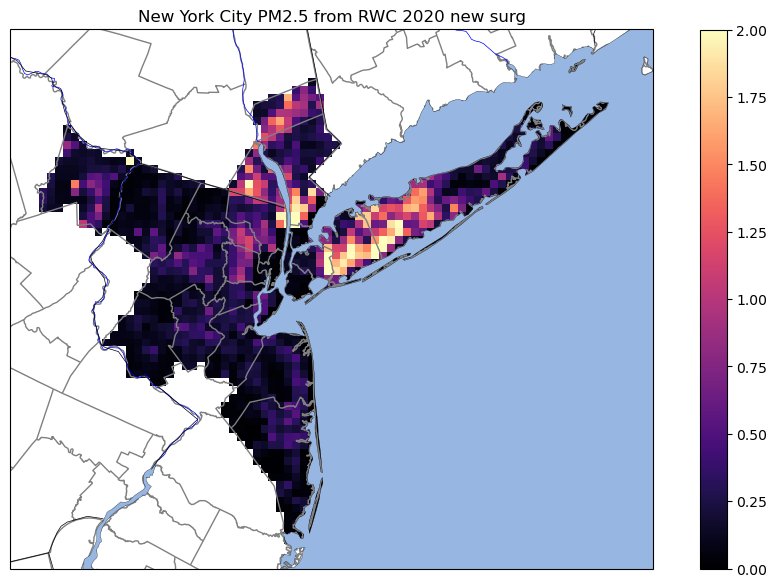

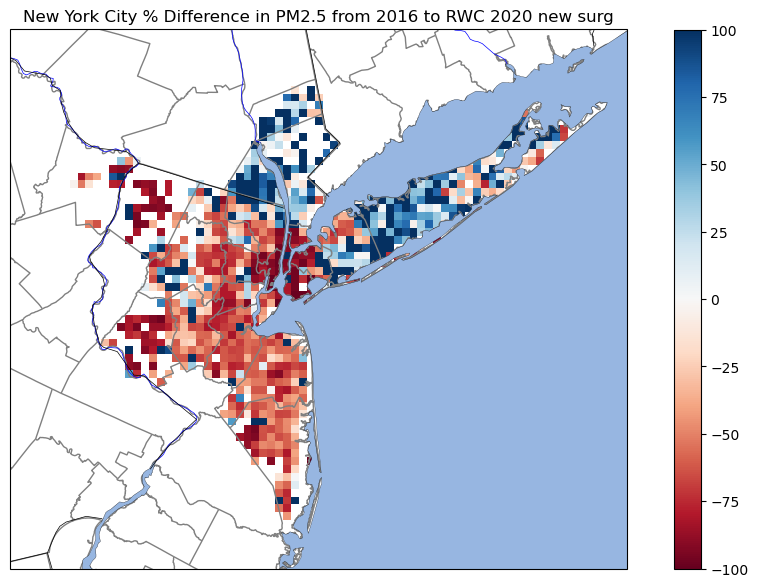

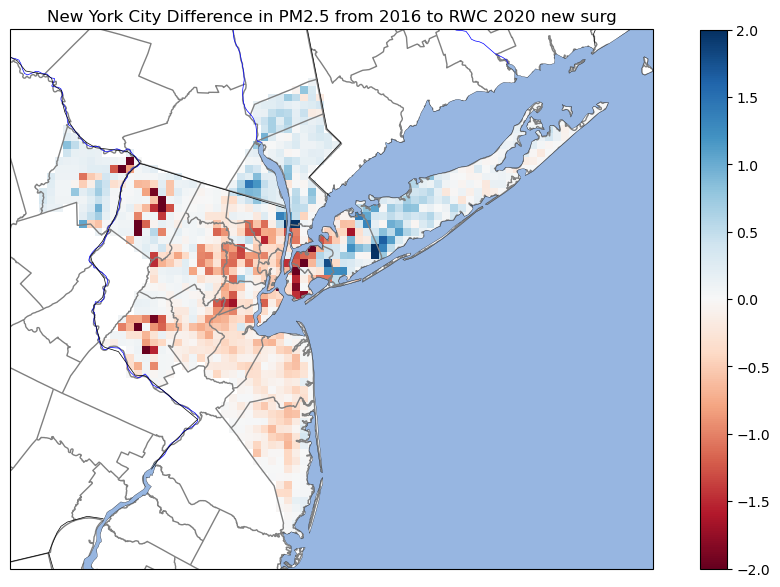

In [24]:
sf_df = plot_all(pmgdf, 'New York-Newark-Jersey City, NY-NJ-PA', 'New York City')

98.78858855520427


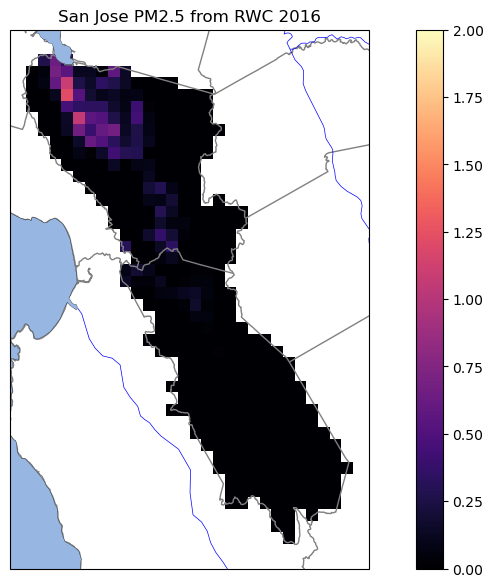

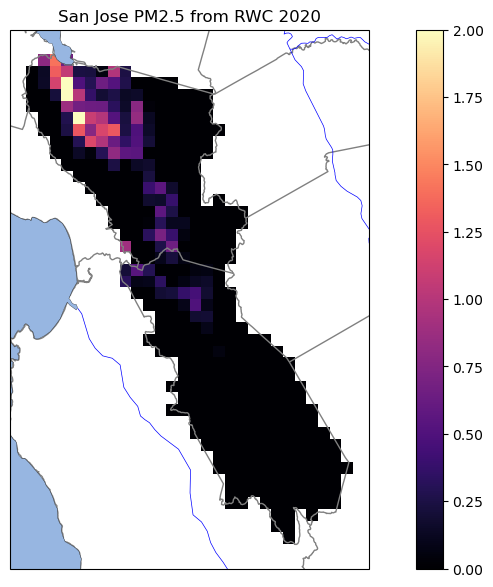

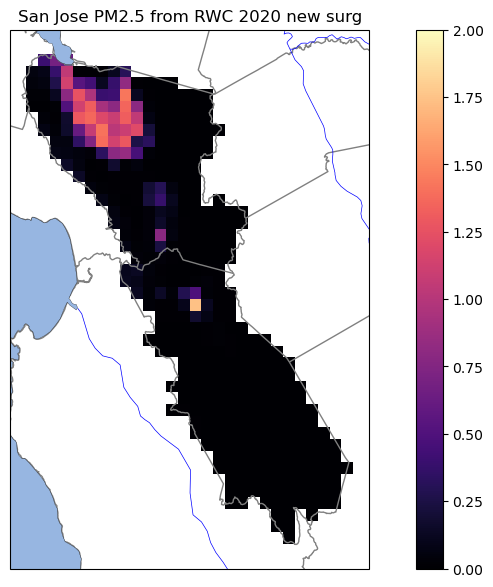

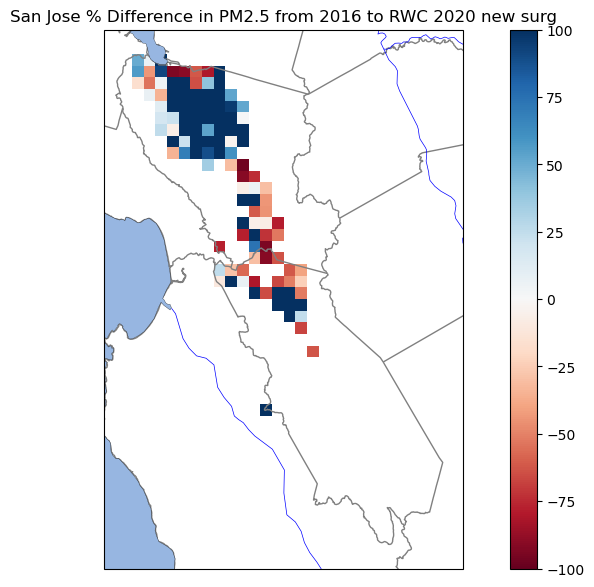

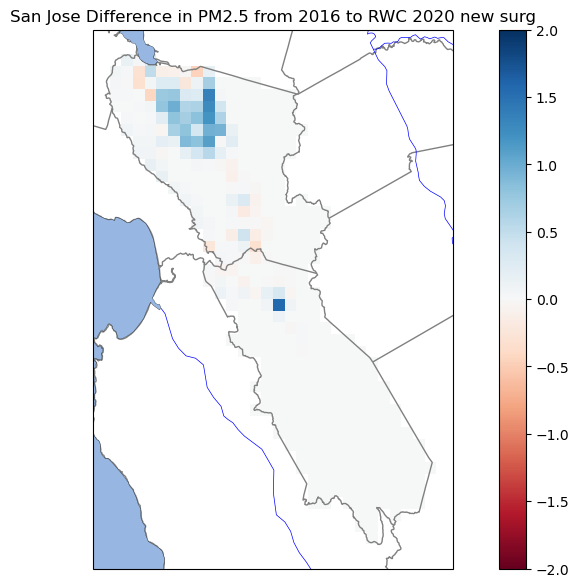

In [18]:
sf_df = plot_all(pmgdf, 'San Jose-Sunnyvale-Santa Clara, CA', 'San Jose')

-43.69836899848903


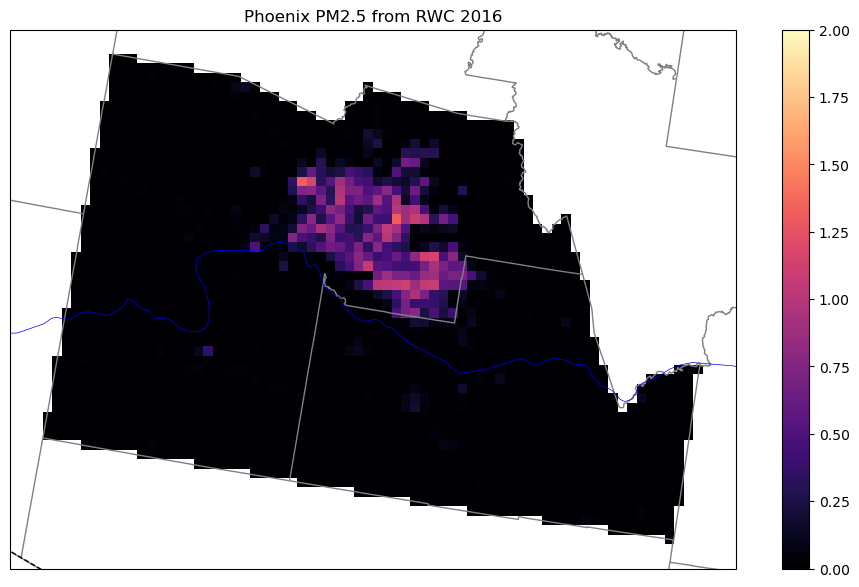

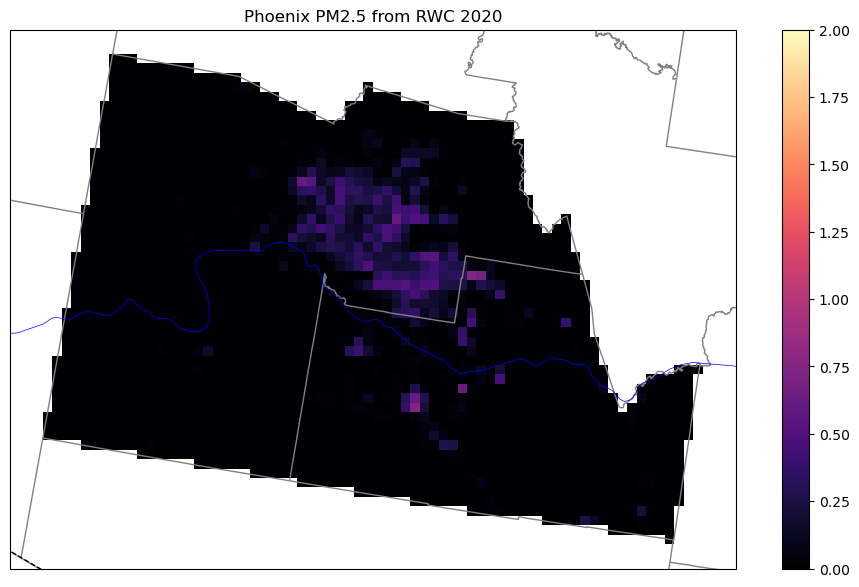

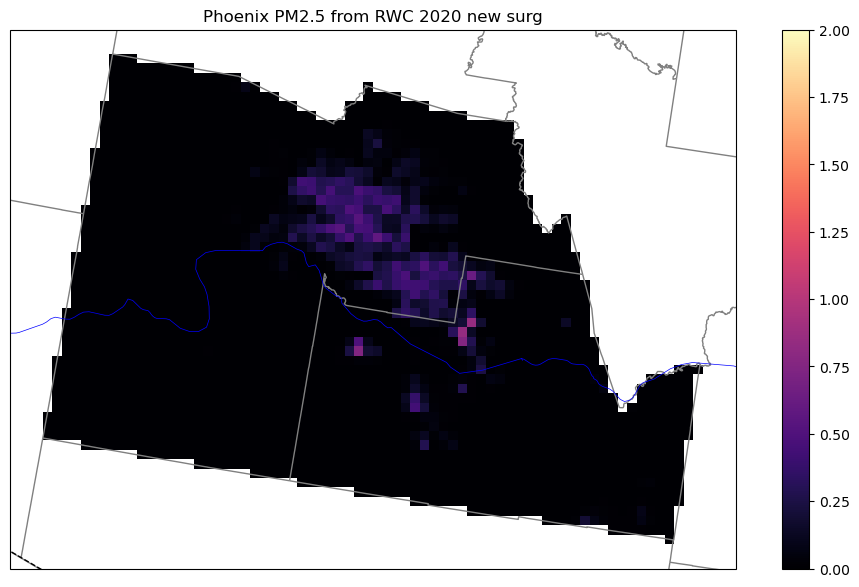

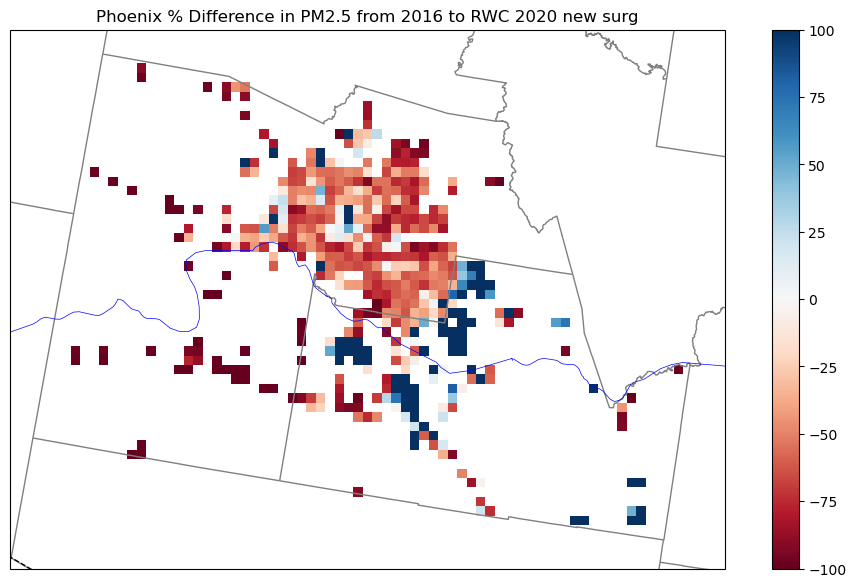

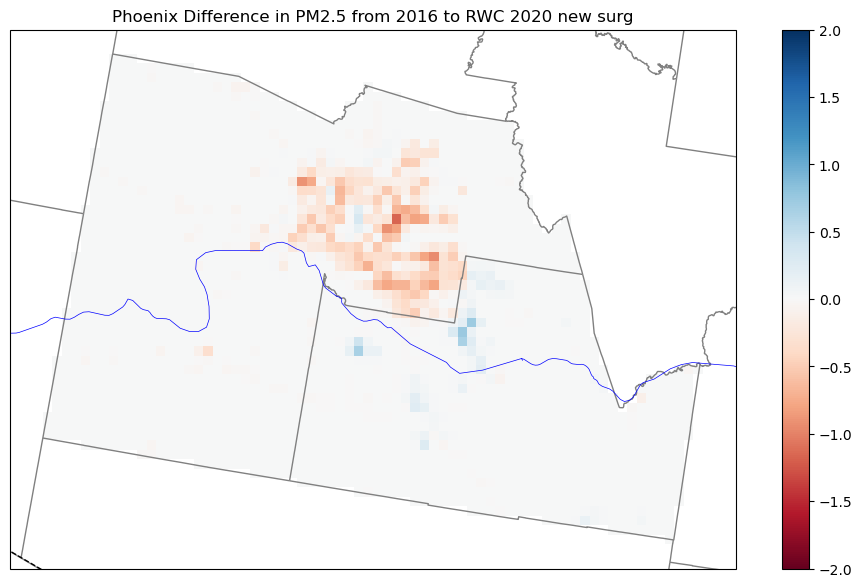

In [19]:
sf_df = plot_all(pmgdf, 'Phoenix-Mesa-Chandler, AZ', 'Phoenix')

-23.683815969915912


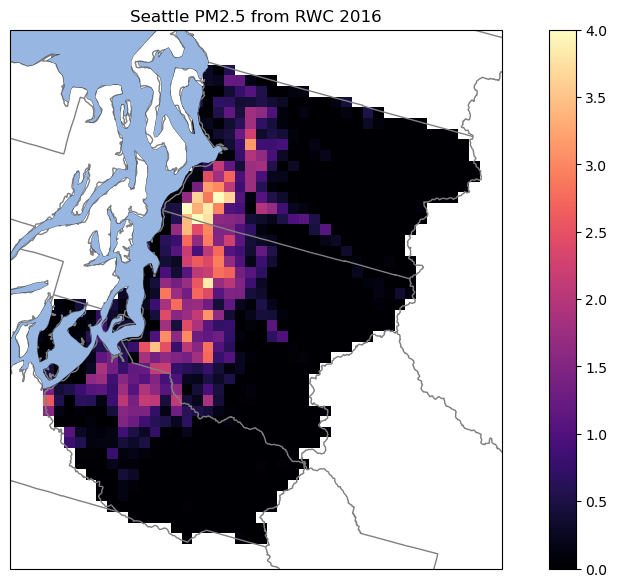

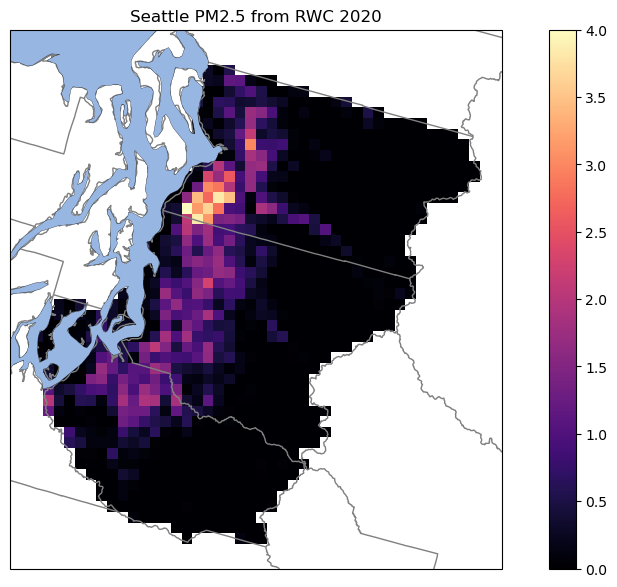

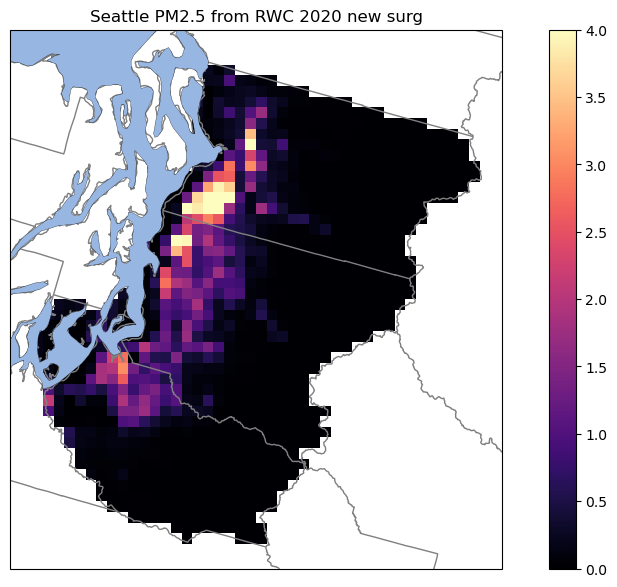

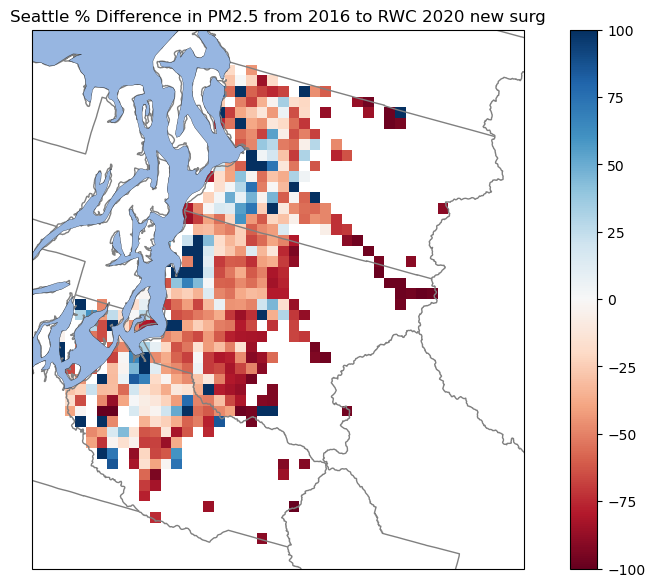

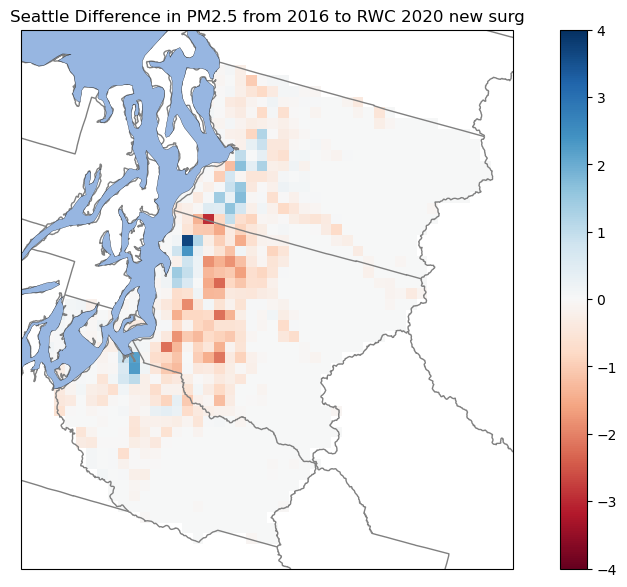

In [21]:
sf_df = plot_all(pmgdf, 'Seattle-Tacoma-Bellevue, WA', 'Seattle', vs1 = [0,4])

-5.1757768840018485


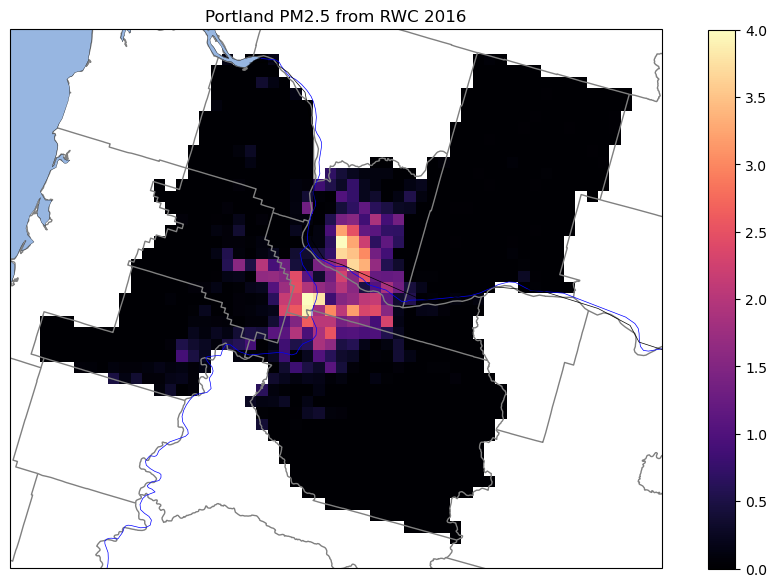

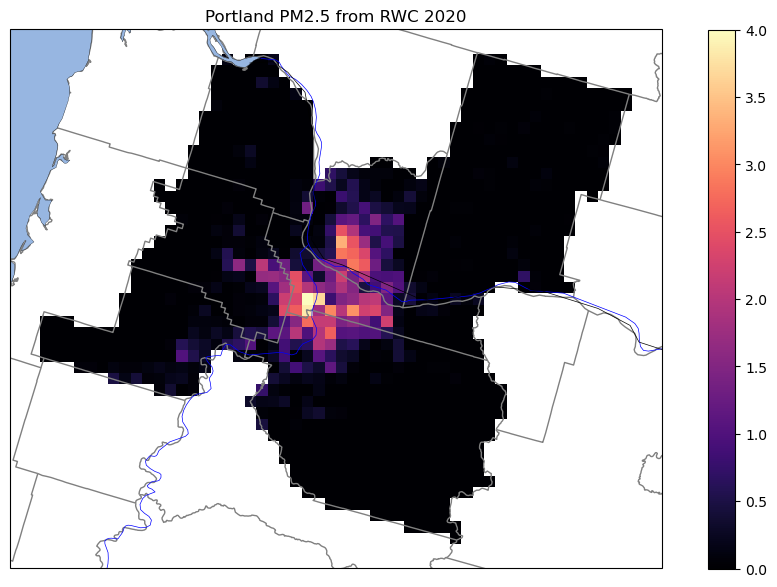

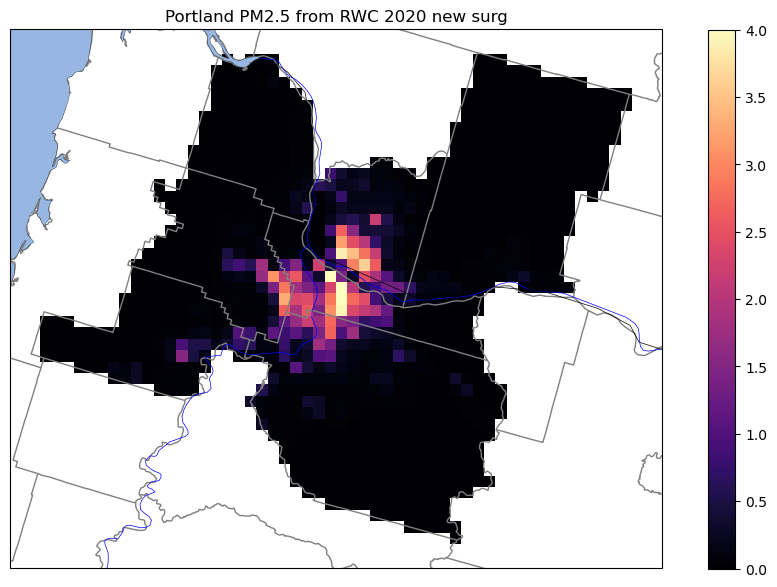

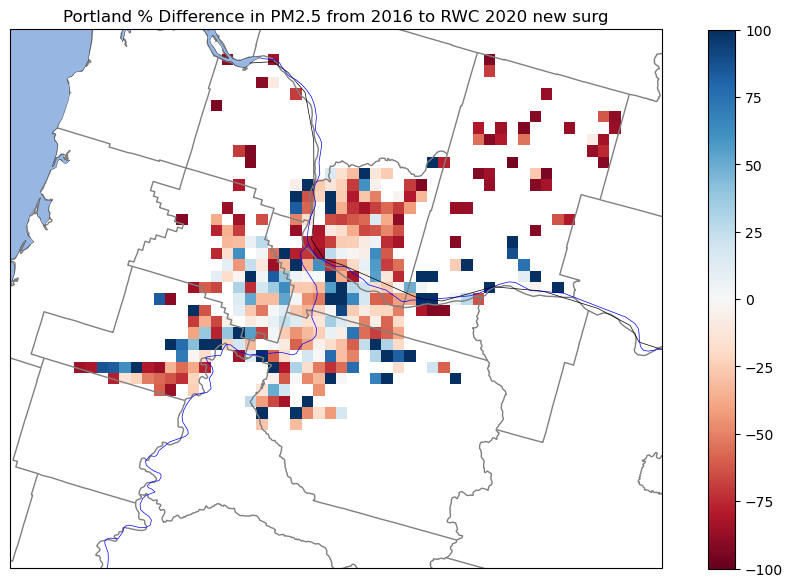

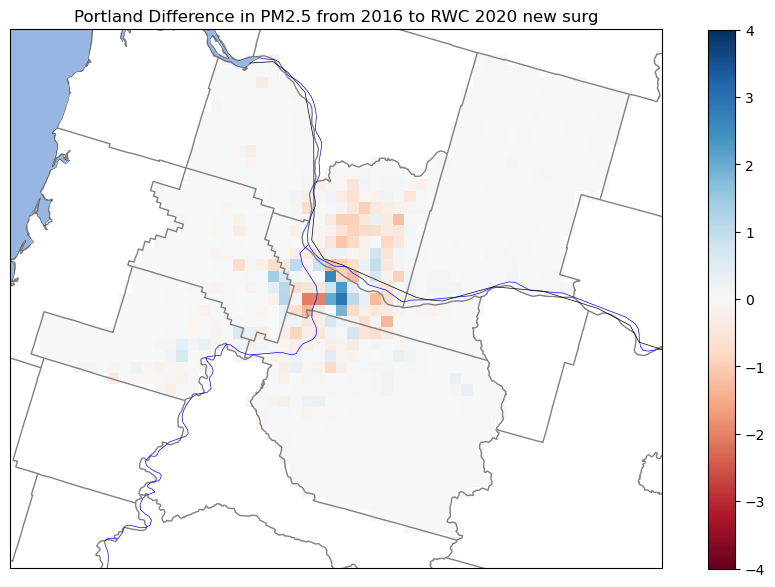

In [23]:
sf_df = plot_all(pmgdf,'Portland-Vancouver-Hillsboro, OR-WA', 'Portland', vs1 = [0,4])

In [ ]:
sf_df = plot_all(pmgdf,'Portland-Vancouver-Hillsboro, OR-WA', 'Portland', vs1 = [0,4])

## CONUS

In [24]:
seconds_in_a_day = 24 * 60 * 60  # Number of seconds in a day
days_in_month = 31  # Approximate days in a month (adjust if necessary)
seconds_in_a_month = seconds_in_a_day * days_in_month
grams_to_tons = 1 / 1_000_000  # Conversion factor from grams to tons
gps_to_tons = seconds_in_a_month * grams_to_tons
rwc_2020_new_surg['PM25_total_tons'] = rwc_2020_new_surg['PM25_total'] * gps_to_tons
rwc_2016['PM25_total_tons'] = rwc_2016['PM25_total'] * gps_to_tons


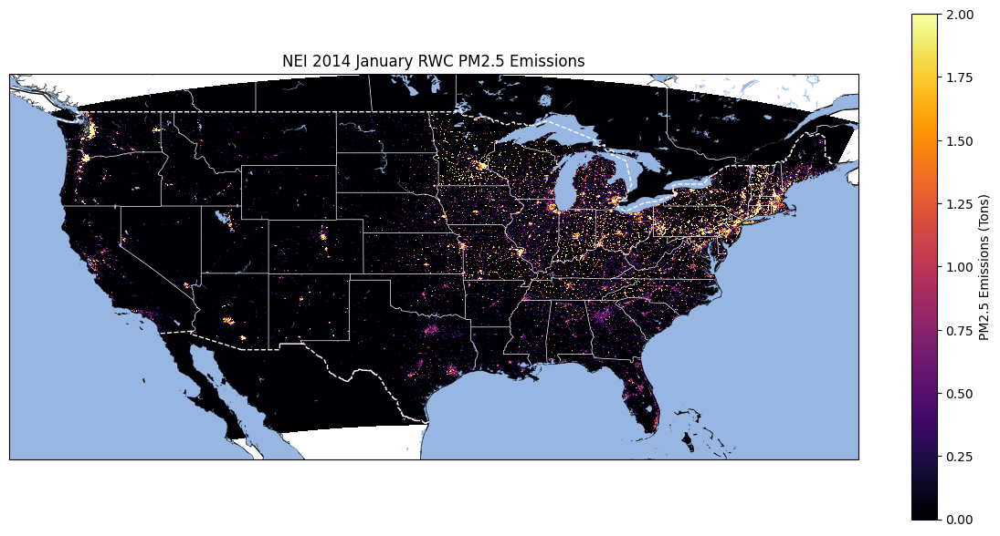

In [28]:
plot(data = rwc_2016['PM25_total_tons'][0,0,:,:],
     vs = [0,2],
     label =  "PM2.5 Emissions (Tons)", 
     title = "NEI 2014 January RWC PM2.5 Emissions",
     lon = lon,
     lat = lat
    )

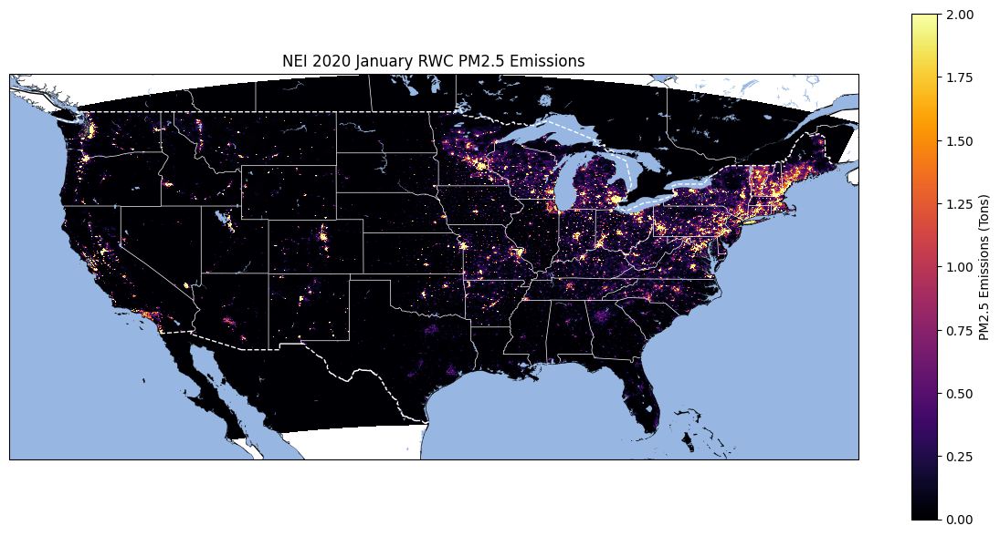

In [29]:
plot(data = rwc_2020_new_surg['PM25_total_tons'][0,0,:,:],
     vs = [0,2],
     label =  "PM2.5 Emissions (Tons)", 
     title = "NEI 2020 January RWC PM2.5 Emissions",
     lon = lon,
     lat = lat
    )

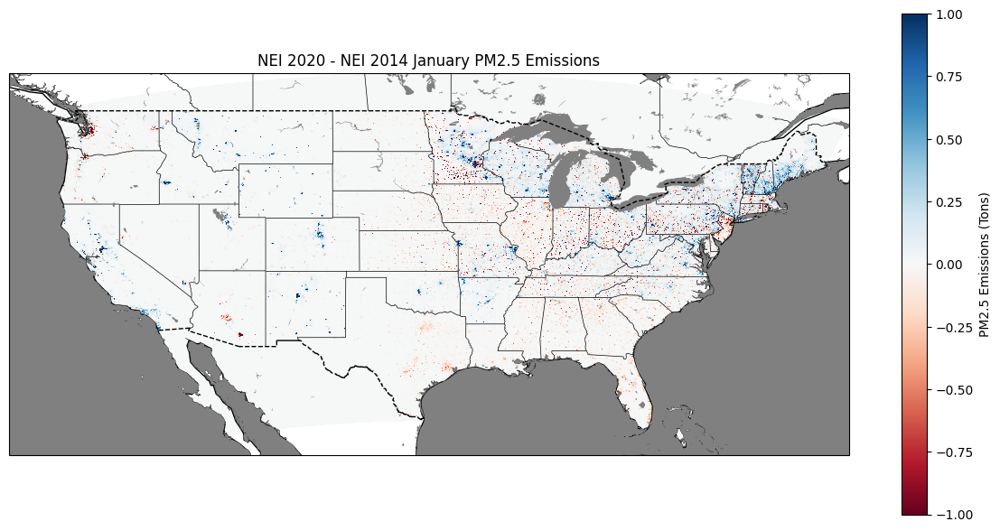

In [33]:
plot(data = rwc_2020_new_surg['PM25_total'][0,0,:,:] - rwc_2016['PM25_total'][0,0,:,:],
     vs = [-1,1],
     label =  "PM2.5 Emissions (Tons)", 
     title = "NEI 2020 - NEI 2014 January PM2.5 Emissions",
     lon = lon,
     lat = lat,
     counties = False,
     difference = True
    )

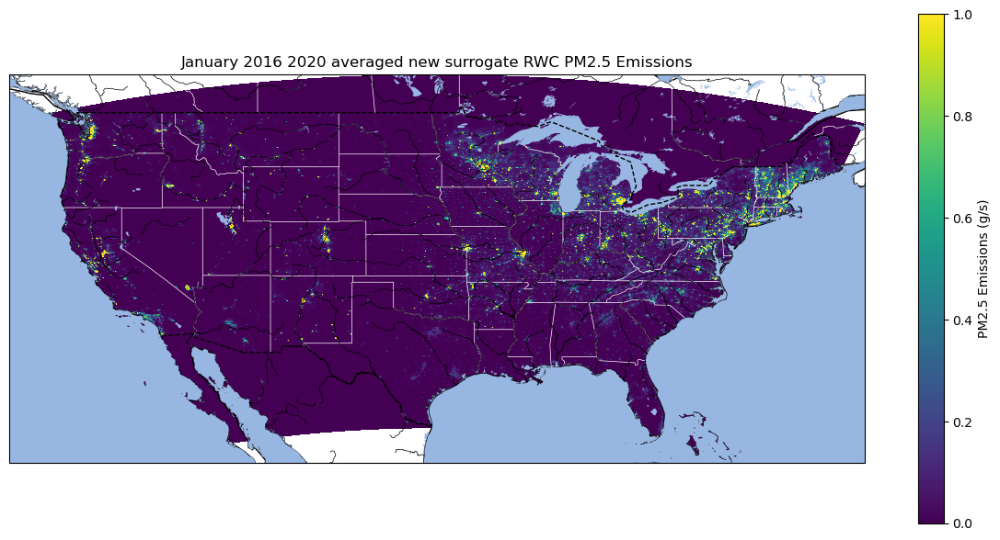

In [56]:
plot(data = rwc_2020_new_surg['PM25_total'][0,0,:,:],
     vs = [0,1],
     label =  "PM2.5 Emissions (g/s)", 
     title = "January 2016 2020 averaged new surrogate RWC PM2.5 Emissions",
     lon = lon,
     lat = lat
    )

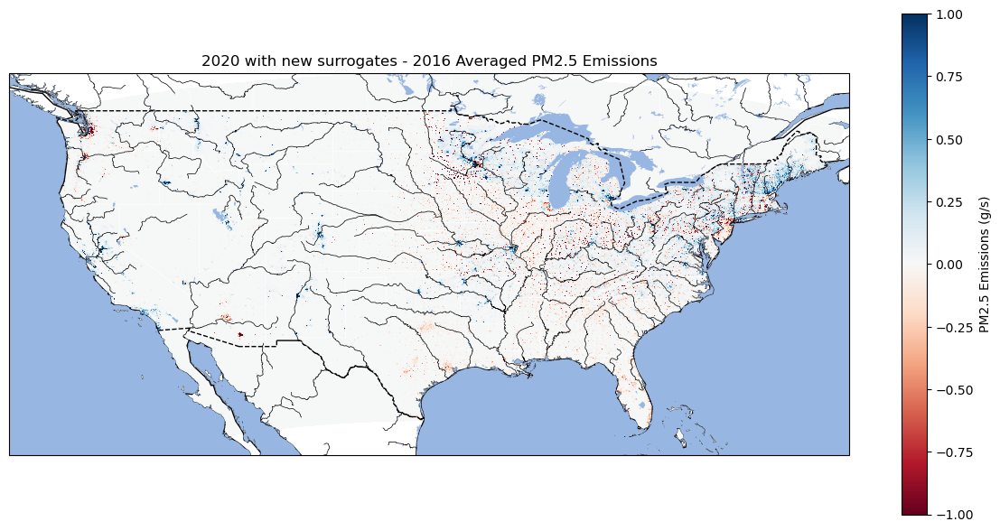

In [77]:
plot(data = rwc_2020_new_surg['PM25_total'][0,0,:,:] - rwc_2016['PM25_total'][0,0,:,:],
     vs = [-1,1],
     label =  "PM2.5 Emissions (g/s)", 
     title = "2020 with new surrogates - 2016 Averaged PM2.5 Emissions",
     lon = lon,
     lat = lat,
     counties = False,
     difference = True
    )

## Chicago Total Emissions

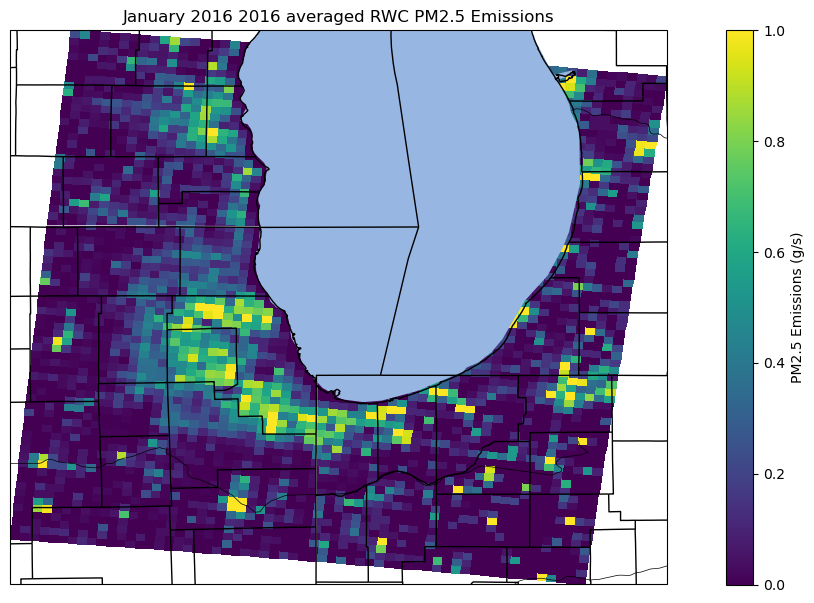

In [78]:
plot(data = rwc_2016['PM25_total'][0,0,:,:],
     vs = [0,1],
     label =  "PM2.5 Emissions (g/s)", 
     title = "January 2016 2016 averaged RWC PM2.5 Emissions",
     lon = lon,
     lat = lat,
     counties = True,
     bounds = [[430,500], [740,800]]
    )

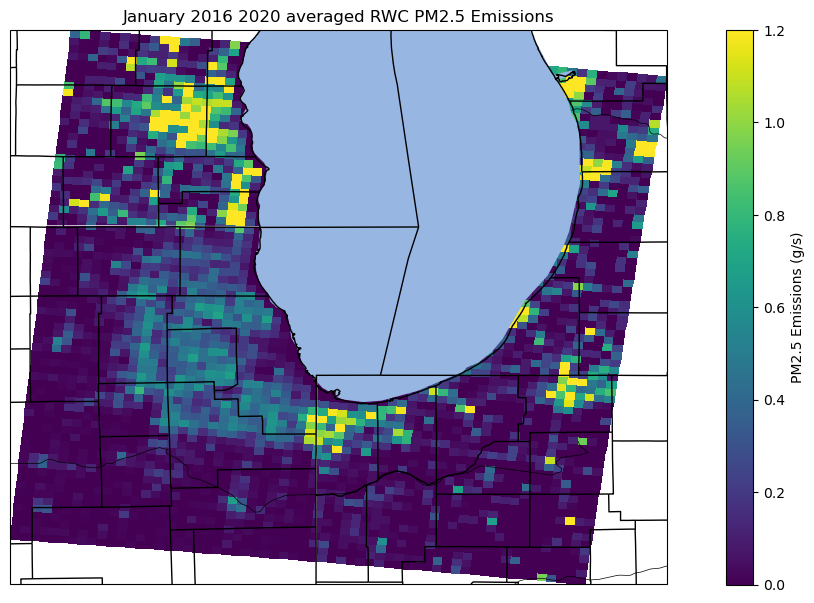

In [79]:
plot(data = rwc_2020['PM25_total'][0,0,:,:],
     vs = [0,1.2],
     label =  "PM2.5 Emissions (g/s)", 
     title = "January 2016 2020 averaged RWC PM2.5 Emissions",
     lon = lon,
     lat = lat,
     counties = True,
     bounds = [[430,500], [740,800]]
    )

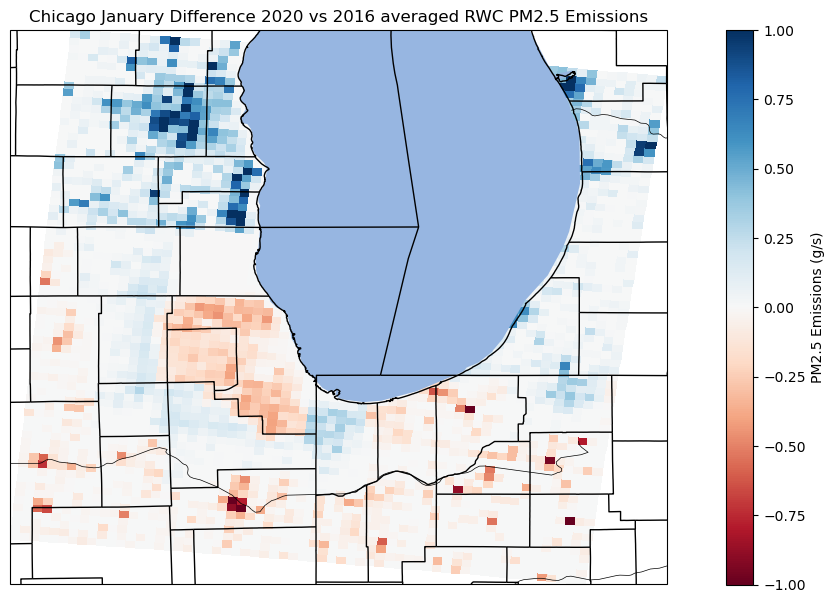

In [81]:
plot(data = (rwc_2020['PM25_total'][0,0,:,:] - rwc_2016['PM25_total'][0,0,:,:]),
     vs = [-1,1],
     label =  "PM2.5 Emissions (g/s)", 
     title = "Chicago January Difference 2020 vs 2016 averaged RWC PM2.5 Emissions",
     lon = lon,
     lat = lat,
     counties = True,
     bounds = [[430,500], [740,800]],
     difference = True
    )

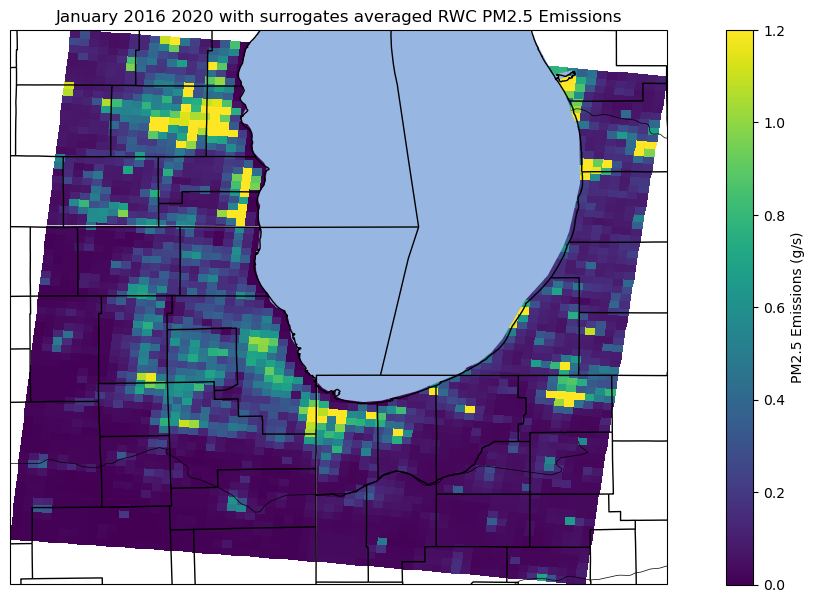

In [82]:
plot(data = rwc_2020_new_surg['PM25_total'][0,0,:,:],
     vs = [0,1.2],
     label =  "PM2.5 Emissions (g/s)", 
     title = "January 2016 2020 with surrogates averaged RWC PM2.5 Emissions",
     lon = lon,
     lat = lat,
     counties = True,
     bounds = [[430,500], [740,800]]
    )

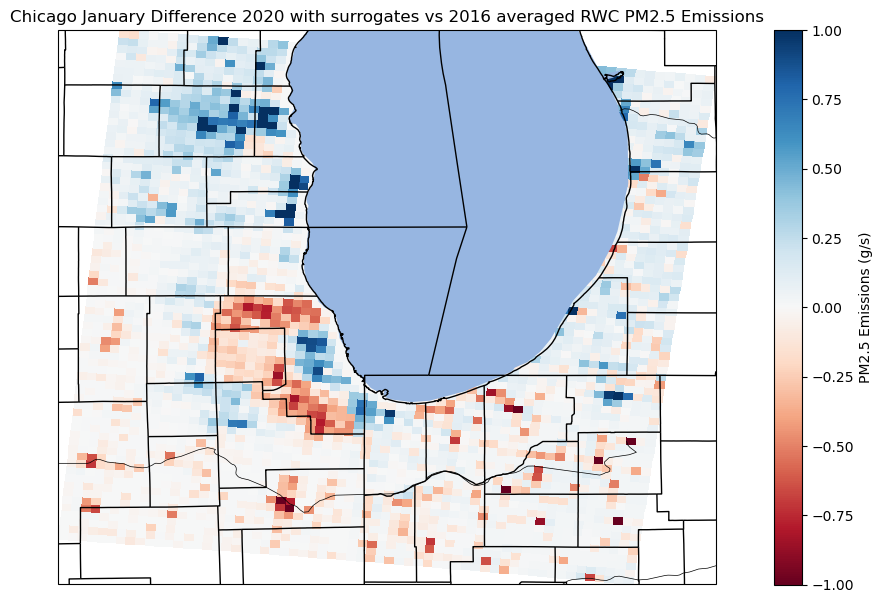

In [83]:
plot(data = (rwc_2020_new_surg['PM25_total'][0,0,:,:] - rwc_2016['PM25_total'][0,0,:,:]),
     vs = [-1,1],
     label =  "PM2.5 Emissions (g/s)", 
     title = "Chicago January Difference 2020 with surrogates vs 2016 averaged RWC PM2.5 Emissions",
     lon = lon,
     lat = lat,
     counties = True,
     bounds = [[430,500], [740,800]],
     difference = True
    )

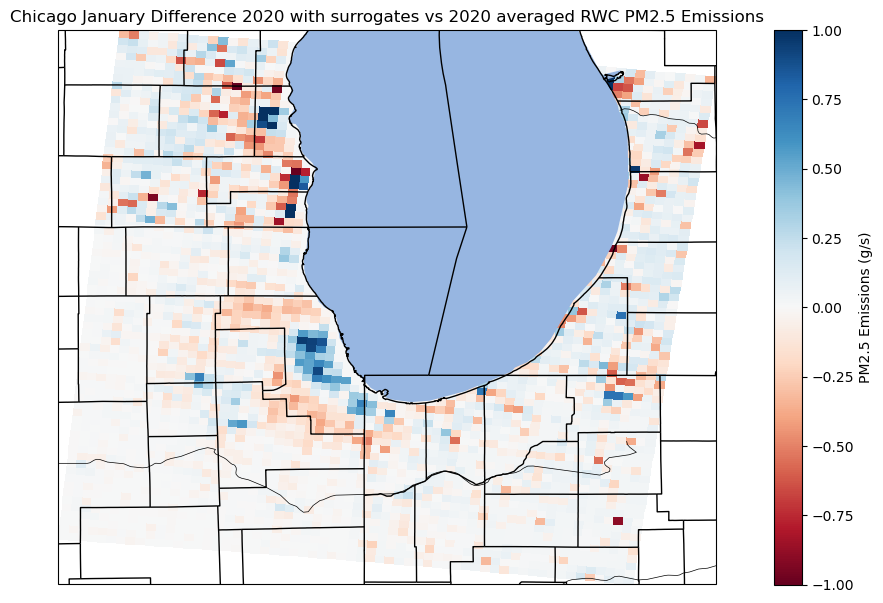

In [84]:
plot(data = (rwc_2020_new_surg['PM25_total'][0,0,:,:] - rwc_2020['PM25_total'][0,0,:,:]),
     vs = [-1,1],
     label =  "PM2.5 Emissions (g/s)", 
     title = "Chicago January Difference 2020 with surrogates vs 2020 averaged RWC PM2.5 Emissions",
     lon = lon,
     lat = lat,
     counties = True,
     bounds = [[430,500], [740,800]],
     difference = True
    )

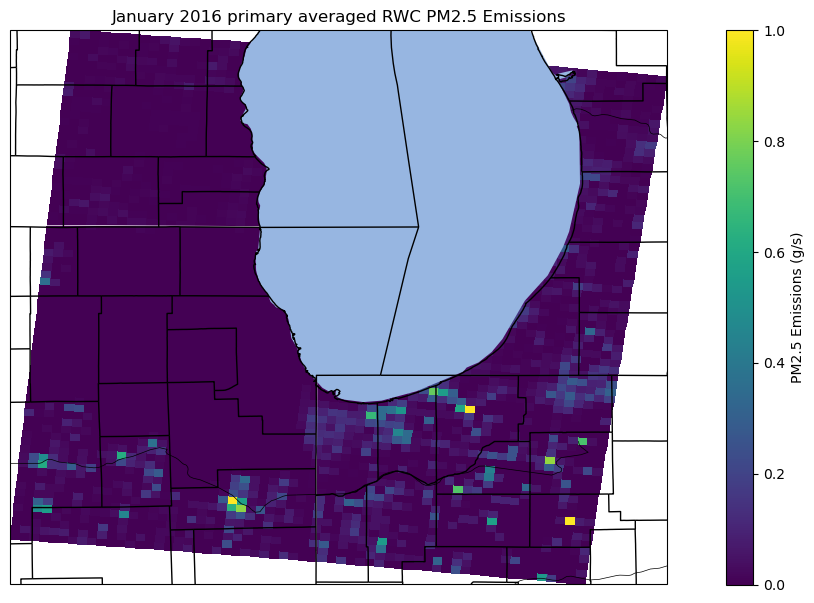

In [64]:
plot(data = rwc_2016_primary['PM25_total'][0,0,:,:],
     vs = [0,1],
     label =  "PM2.5 Emissions (g/s)", 
     title = "January 2016 primary averaged RWC PM2.5 Emissions",
     lon = lon,
     lat = lat,
     counties = True,
     bounds = [[430,500], [740,800]]
    )

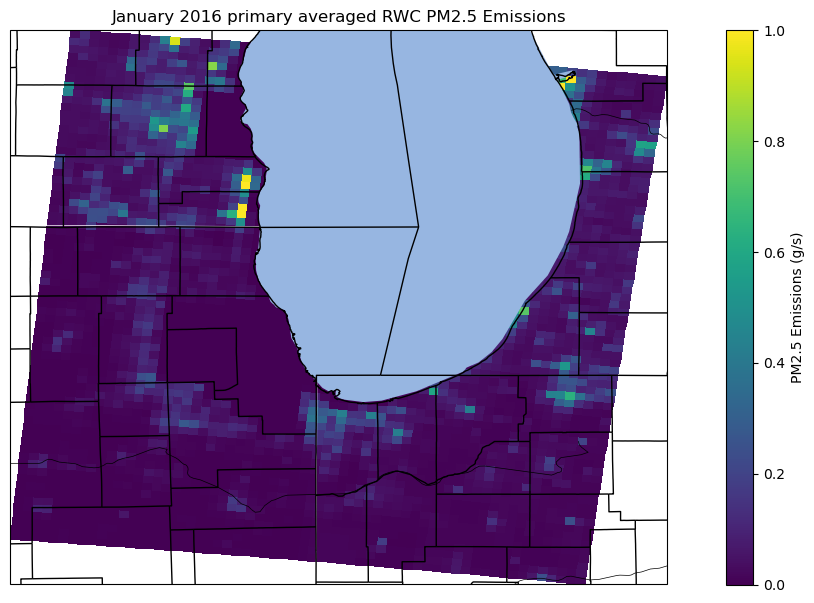

In [65]:
plot(data = rwc_2020_primary['PM25_total'][0,0,:,:],
     vs = [0,1],
     label =  "PM2.5 Emissions (g/s)", 
     title = "January 2016 primary averaged RWC PM2.5 Emissions",
     lon = lon,
     lat = lat,
     counties = True,
     bounds = [[430,500], [740,800]]
    )

## NYC Analysis

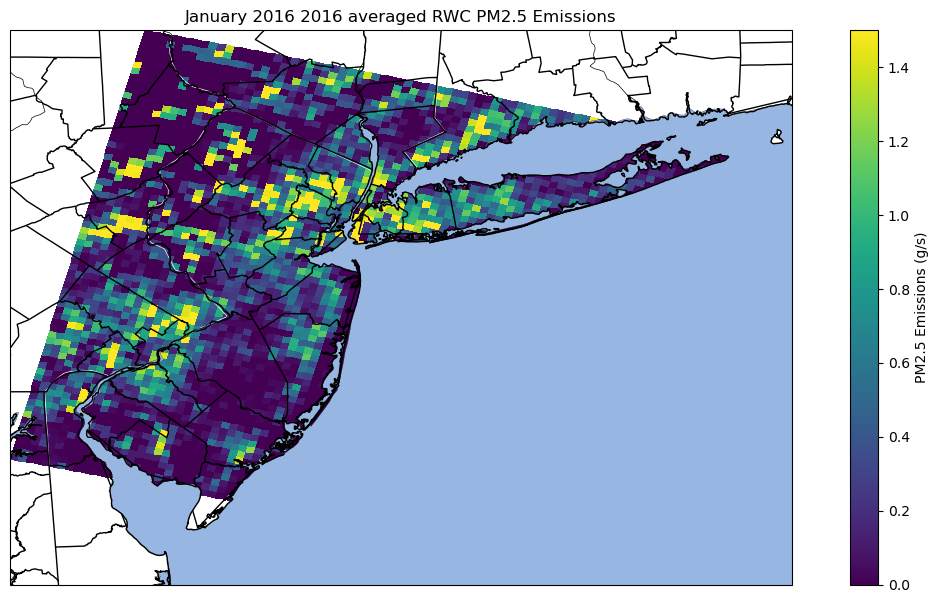

In [85]:
plot(data = rwc_2016['PM25_total'][0,0,:,:],
     vs = [0,1.5],
     label =  "PM2.5 Emissions (g/s)", 
     title = "January 2016 2016 averaged RWC PM2.5 Emissions",
     lon = lon,
     lat = lat,
     counties = True,
     bounds = [[430,500], [1020,1100]]
    )

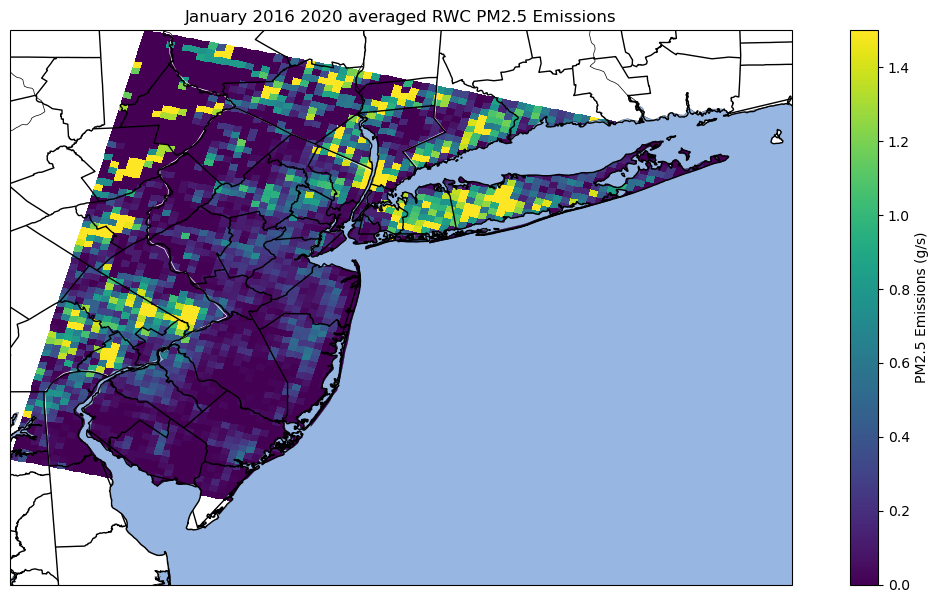

In [86]:
plot(data = rwc_2020['PM25_total'][0,0,:,:],
     vs = [0,1.5],
     label =  "PM2.5 Emissions (g/s)", 
     title = "January 2016 2020 averaged RWC PM2.5 Emissions",
     lon = lon,
     lat = lat,
     counties = True,
     bounds = [[430,500], [1020,1100]]
    )

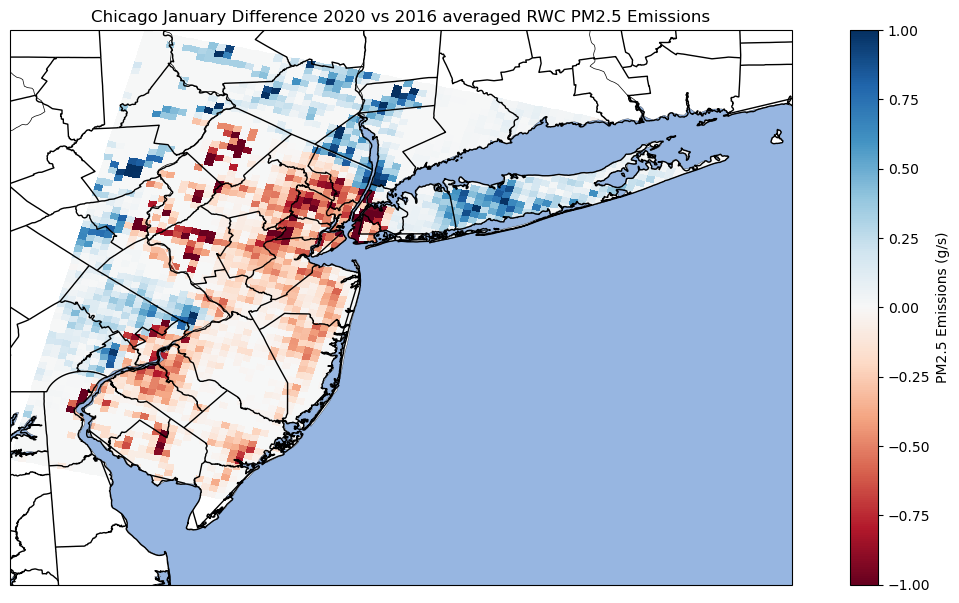

In [87]:
plot(data = (rwc_2020['PM25_total'][0,0,:,:] - rwc_2016['PM25_total'][0,0,:,:]),
     vs = [-1,1],
     label =  "PM2.5 Emissions (g/s)", 
     title = "Chicago January Difference 2020 vs 2016 averaged RWC PM2.5 Emissions",
     lon = lon,
     lat = lat,
     counties = True,
     bounds = [[430,500], [1020,1100]],
     difference = True
    )

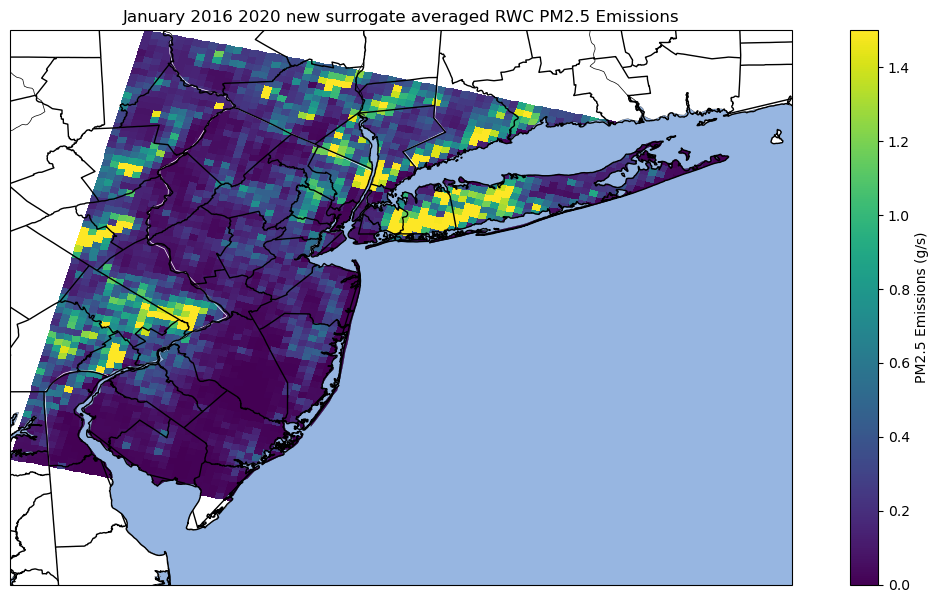

In [88]:
plot(data = rwc_2020_new_surg['PM25_total'][0,0,:,:],
     vs = [0,1.5],
     label =  "PM2.5 Emissions (g/s)", 
     title = "January 2016 2020 new surrogate averaged RWC PM2.5 Emissions",
     lon = lon,
     lat = lat,
     counties = True,
     bounds = [[430,500], [1020,1100]]
    )

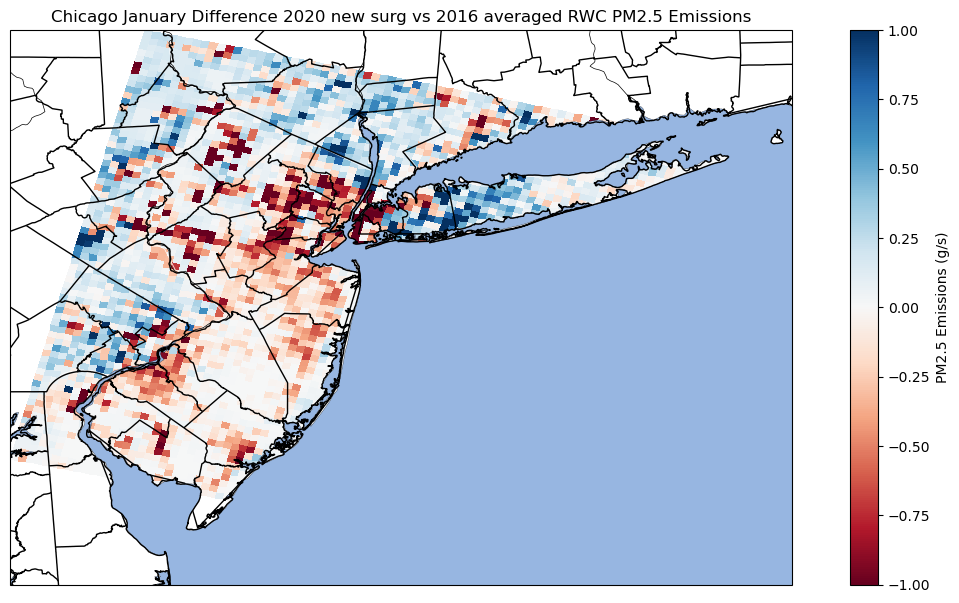

In [89]:
plot(data = (rwc_2020_new_surg['PM25_total'][0,0,:,:] - rwc_2016['PM25_total'][0,0,:,:]),
     vs = [-1,1],
     label =  "PM2.5 Emissions (g/s)", 
     title = "Chicago January Difference 2020 new surg vs 2016 averaged RWC PM2.5 Emissions",
     lon = lon,
     lat = lat,
     counties = True,
     bounds = [[430,500], [1020,1100]],
     difference = True
    )

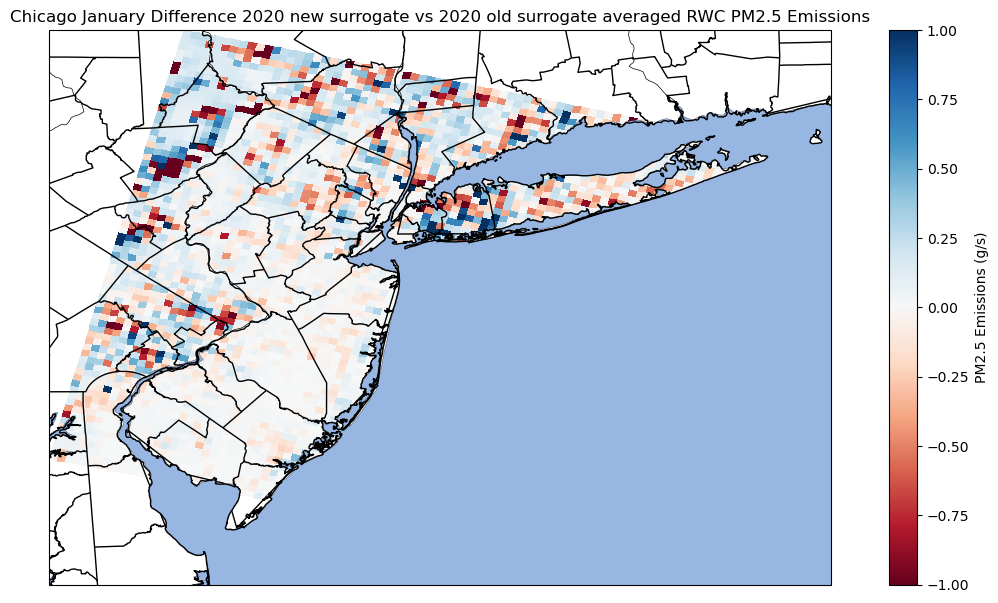

In [90]:
plot(data = (rwc_2020_new_surg['PM25_total'][0,0,:,:] - rwc_2020['PM25_total'][0,0,:,:]),
     vs = [-1,1],
     label =  "PM2.5 Emissions (g/s)", 
     title = "Chicago January Difference 2020 new surrogate vs 2020 old surrogate averaged RWC PM2.5 Emissions",
     lon = lon,
     lat = lat,
     counties = True,
     bounds = [[430,500], [1020,1100]],
     difference = True
    )

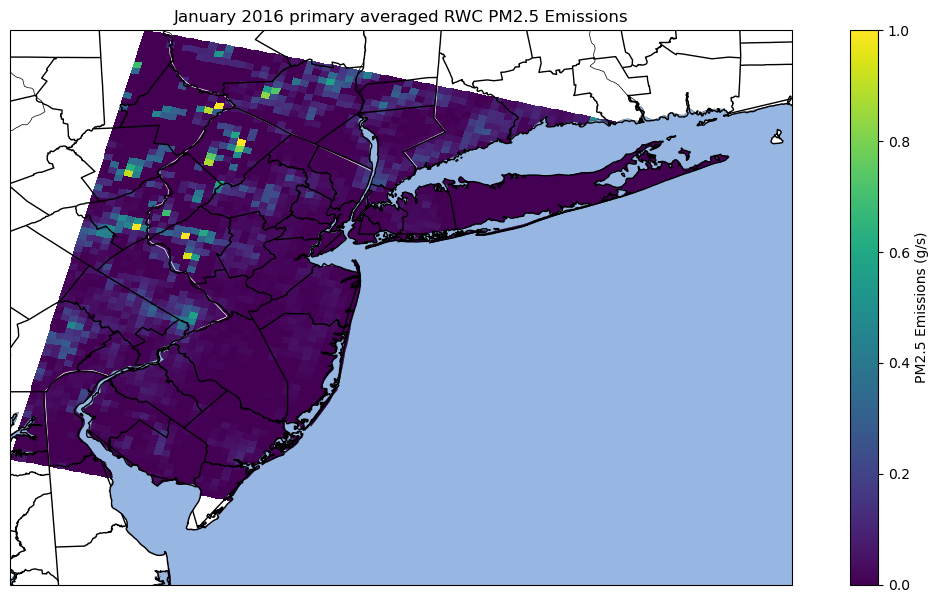

In [72]:
plot(data = rwc_2016_primary['PM25_total'][0,0,:,:],
     vs = [0,1],
     label =  "PM2.5 Emissions (g/s)", 
     title = "January 2016 primary averaged RWC PM2.5 Emissions",
     lon = lon,
     lat = lat,
     counties = True,
     bounds = [[430,500], [1020,1100]]
    )

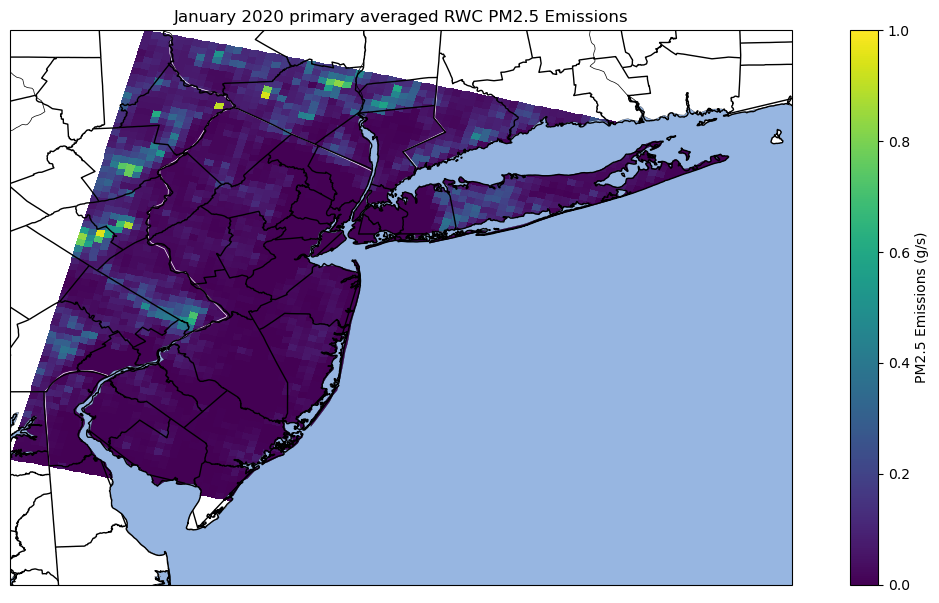

In [73]:
plot(data = rwc_2020_primary['PM25_total'][0,0,:,:],
     vs = [0,1],
     label =  "PM2.5 Emissions (g/s)", 
     title = "January 2020 primary averaged RWC PM2.5 Emissions",
     lon = lon,
     lat = lat,
     counties = True,
     bounds = [[430,500], [1020,1100]]
    )

In [74]:
rwc_2020_new_surg['PM25_total'][0,0,:,:].mean() - rwc_2016['PM25_total'][0,0,:,:].mean()

<xarray.DataArray 'PM25_total' ()>
array(0.0027121, dtype=float32)

In [75]:
rwc_2020['PM25_total'][0,0,:,:].sum()

<xarray.DataArray 'PM25_total' ()>
array(25276.3, dtype=float32)

In [76]:
rwc_2016['PM25_total'][0,0,:,:].sum()

<xarray.DataArray 'PM25_total' ()>
array(23001.646, dtype=float32)

# population weighting

### Calculations

In [91]:
# Read the .txt file into a pandas DataFrame
population_df = pd.read_csv('population.txt', delimiter='\t', header=None, skiprows=25)

# Specify coordinates to align population and emission data
population_df = population_df.rename(columns = {2:"COLS", 3:"ROWS"})
population_df["COLS"] -= 111 
population_df["ROWS"] -= 126   

In [92]:
# pollutants into a dataframe
emissions_all_df = rwc_2020['PM25_total'][0,0,:,:].to_dataframe()
emissions_all_df = emissions_all_df.rename({'PM25_total':'2020 pm2.5'})
emissions_all_df['2020_new_surrogate_pm2.5'] = rwc_2020_new_surg['PM25_total'][0,0,:,:].to_dataframe()
emissions_all_df['2016_pm2.5'] = rwc_2016['PM25_total'][0,0,:,:].to_dataframe()
emissions_all_df['total_pm2.5'] = total['PM25_total'][0,0,:,:].to_dataframe()
emissions_all_df['2016_primary_pm2.5'] = rwc_2016_primary['PM25_total'][0,0,:,:].to_dataframe()
emissions_all_df['2020_primary_pm2.5'] = rwc_2020_primary['PM25_total'][0,0,:,:].to_dataframe()
emissions_all_df = emissions_all_df.reset_index()
emissions_all_df

,ROW,COL,PM25_total,2020_new_surrogate_pm2.5,2016_pm2.5,total_pm2.5,2016_primary_pm2.5,2020_primary_pm2.5
0,0,0,0.0,0.0,0.0,0.000000,0.0,0.0
1,0,1,0.0,0.0,0.0,0.000000,0.0,0.0
2,0,2,0.0,0.0,0.0,0.000000,0.0,0.0
3,0,3,0.0,0.0,0.0,0.000000,0.0,0.0
4,0,4,0.0,0.0,0.0,0.000000,0.0,0.0
...,...,...,...,...,...,...,...,...
838525,725,1150,0.0,0.0,0.0,0.054439,0.0,0.0
838526,725,1151,0.0,0.0,0.0,0.104290,0.0,0.0
838527,725,1152,0.0,0.0,0.0,0.169372,0.0,0.0
838528,725,1153,0.0,0.0,0.0,0.349826,0.0,0.0


In [93]:
# merge pollutants and population
merged_df = pd.merge(emissions_all_df, population_df, left_on=['ROW', 'COL'], right_on=['ROWS', 'COLS'])
merged_df['population'] = merged_df[6] 
merged_df['2016 PWC'] = merged_df['2016_pm2.5'] * merged_df['population']
merged_df['2020 new surg PWC'] = merged_df['2020_new_surrogate_pm2.5'] * merged_df['population']
merged_df['2020 PWC'] = merged_df['PM25_total'] * merged_df['population']
merged_df['2016 primary PWC'] = merged_df['2016_primary_pm2.5'] * merged_df['population']
merged_df['2020 primary PWC'] = merged_df['2020_primary_pm2.5'] * merged_df['population']
merged_df['total PWC'] = merged_df['total_pm2.5'] * merged_df['population']

In [94]:
sum_2016_PWC = merged_df['2016 PWC'].sum()
sum_2016_primary_PWC = merged_df['2016 primary PWC'].sum()
sum_2020_PWC = merged_df['2020 PWC'].sum()
sum_2020_new_surg_PWC = merged_df['2020 new surg PWC'].sum()
sum_2020_primary_PWC = merged_df['2020 primary PWC'].sum()
total_PWC = merged_df['total PWC'].sum()

### Display Respective Fractions

In [95]:
percent_2020_new_surg = float(rwc_2020_new_surg['PM25_total'][0,0,:,:].sum()/total['PM25_total'][0,0,:,:].sum() *100)
percent_2020 = float(rwc_2020['PM25_total'][0,0,:,:].sum()/total['PM25_total'][0,0,:,:].sum() *100)
percent_2016 = float(rwc_2016['PM25_total'][0,0,:,:].sum()/total['PM25_total'][0,0,:,:].sum() *100)
percent_2016_primary = float(rwc_2016_primary['PM25_total'][0,0,:,:].sum()/total['PM25_total'][0,0,:,:].sum() *100)
percent_2020_primary = float(rwc_2020_primary['PM25_total'][0,0,:,:].sum()/total['PM25_total'][0,0,:,:].sum() *100)

print(f"RWC 2016 contribution to total january pm2.5 {round(percent_2016,2)}")
print(f"RWC 2020 contribution to total january pm2.5 {round(percent_2020,2)}")
print(f"RWC 2020 contribution to total january pm2.5 {round(percent_2020_new_surg,2)}")
print(f"Primary RWC 2016 contribution to total january pm2.5 {round(percent_2016_primary,2)}")
print(f"Primary RWC 2020 contribution to total january pm2.5 {round(percent_2020_primary,2)}")

RWC 2016 contribution to total january pm2.5 31.8
RWC 2020 contribution to total january pm2.5 34.95
RWC 2020 contribution to total january pm2.5 34.94
Primary RWC 2016 contribution to total january pm2.5 7.63
Primary RWC 2020 contribution to total january pm2.5 10.37


In [107]:
print(f"RWC 2016 contribution to total population weighted pollution burden \
{100 * round(sum_2016_PWC/total_PWC ,4)} %")

print(f"RWC 2020 contribution to total population weighted pollution burden \
{100 * round(sum_2020_PWC/total_PWC * 329500000/324310011,4)} %")

print(f"RWC 2020 with new surrogates contribution to total population weighted pollution burden \
{100 * round((sum_2020_new_surg_PWC/total_PWC * 329500000/324310011), 4)} %")

print(f"Primary RWC 2016 contribution to total population weighted pollution burden \
{round(100 * (sum_2016_primary_PWC/total_PWC), 2)} %")

print(f"Primary RWC 2020 contribution to total population weighted pollution burden \
{100 * round(sum_2020_primary_PWC/total_PWC * 329500000/324310011,4)} %")

RWC 2016 contribution to total population weighted pollution burden 31.22 %
RWC 2020 contribution to total population weighted pollution burden 35.9 %
RWC 2020 with new surrogates contribution to total population weighted pollution burden 37.22 %
Primary RWC 2016 contribution to total population weighted pollution burden 2.95 %
Primary RWC 2020 contribution to total population weighted pollution burden 5.71 %


In [108]:
sum_2016_PWC/324310011 #population averaged PWC g/s 

0.33949921227619

In [109]:
sum_2020_PWC/329500000  #population averaged PWC g/s 

0.37822288753985706

In [110]:
sum_2020_new_surg_PWC/329500000  #population averaged PWC g/s 

0.3921088552892358

### Plot PWC Results

In [111]:
def pandas_to_ndarray(df, num_rows, num_cols, column = 6):

    # Create an empty numpy array
    numpy_array = np.zeros((num_rows, num_cols), dtype=df[column].dtype)

    # Populate the numpy array with values from the DataFrame
    for index, row in df.iterrows():
        numpy_array[row['ROW'], row['COL']] = row[column]

    return numpy_array

pwc_2016 = pandas_to_ndarray(merged_df, num_rows = 726, num_cols = 1155, column = '2016 PWC')
pwc_2020 = pandas_to_ndarray(merged_df, num_rows = 726, num_cols = 1155, column = '2020 PWC')
pwc_2016_primary = pandas_to_ndarray(merged_df, num_rows = 726, num_cols = 1155, column = '2016 primary PWC')
pwc_2020_primary = pandas_to_ndarray(merged_df, num_rows = 726, num_cols = 1155, column = '2020 primary PWC')
pwc_total = pandas_to_ndarray(merged_df, num_rows = 726, num_cols = 1155, column = 'total PWC')
pwc_2020_new_surg = pandas_to_ndarray(merged_df, num_rows = 726, num_cols = 1155, column = '2020 new surg PWC')

In [112]:
pwc_total+=0.000001 #avoid divide by zero errors

In [113]:
pwc_2016_percent = pwc_2016 / pwc_total * 100
pwc_2020_percent  = pwc_2020 / pwc_total * 100
pwc_2016_primary_percent  = pwc_2016_primary / pwc_total * 100
pwc_2020_primary_percent  = pwc_2020_primary / pwc_total * 100
pwc_2020_new_surg_percent  = pwc_2020_new_surg / pwc_total * 100

#### Totalized Plots

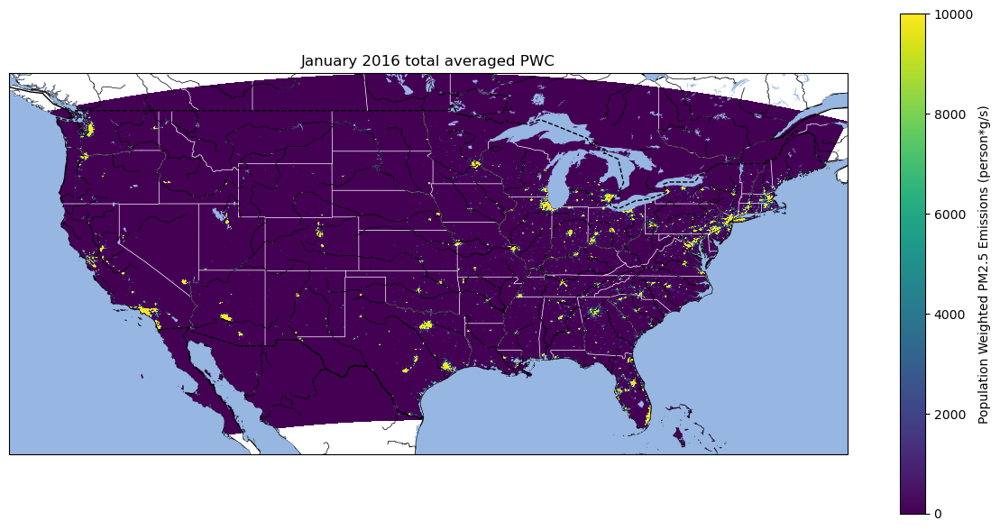

In [135]:
plot(data = pwc_total,
     vs = [0,10000],
     label =  "Population Weighted PM2.5 Emissions (person*g/s)", 
     title = "January 2016 total averaged PWC",
     lon = lon,
     lat = lat,
     #counties = True,
    )

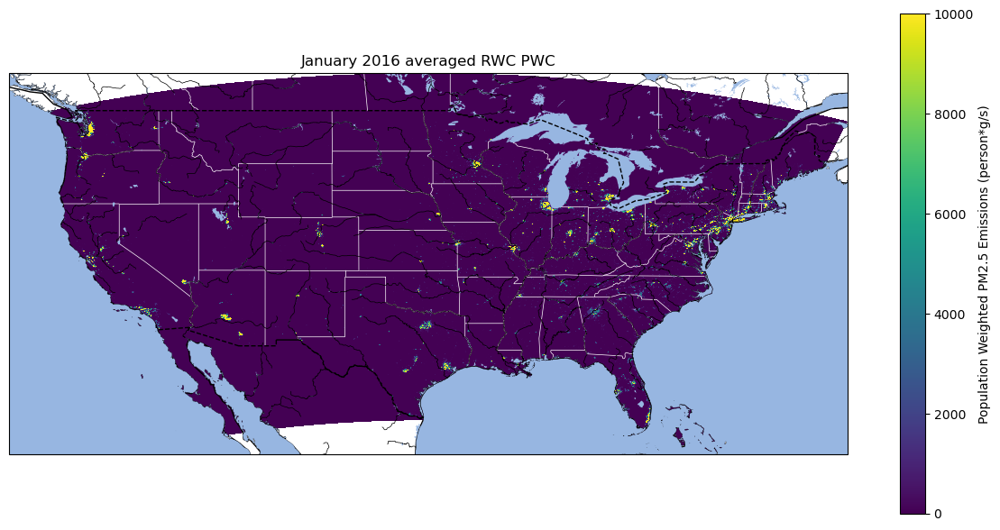

In [136]:
plot(data = pwc_2016,
     vs = [0,10000],
     label =  "Population Weighted PM2.5 Emissions (person*g/s)", 
     title = "January 2016 averaged RWC PWC",
     lon = lon,
     lat = lat,
     #counties = True,
    )

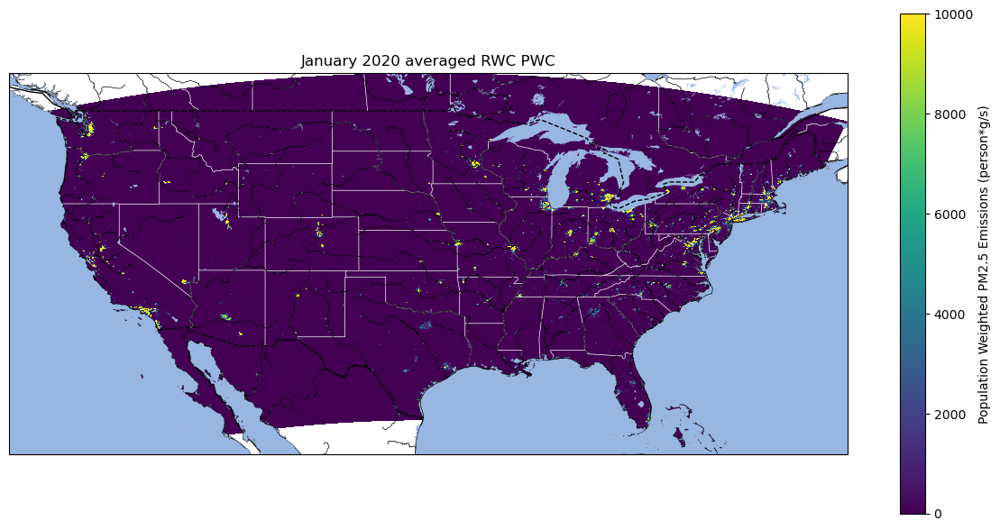

In [138]:
plot(data = pwc_2020,
     vs = [0,10000],
     label =  "Population Weighted PM2.5 Emissions (person*g/s)", 
     title = "January 2020 averaged RWC PWC",
     lon = lon,
     lat = lat,
     #counties = True,
    )

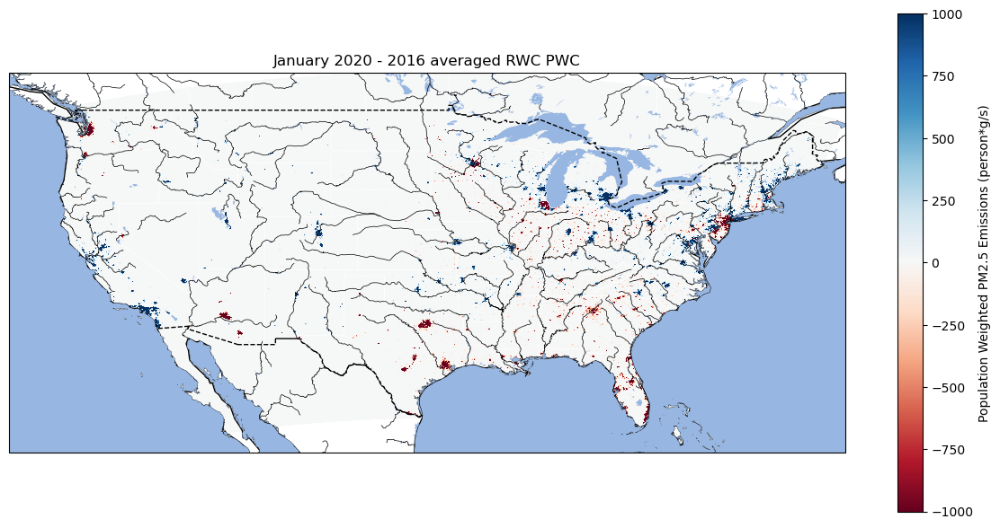

In [142]:
plot(data = pwc_2020 - pwc_2016,
     vs = [-1000,1000],
     label =  "Population Weighted PM2.5 Emissions (person*g/s)", 
     title = "January 2020 - 2016 averaged RWC PWC",
     lon = lon,
     lat = lat,
     counties = False,
     difference = True,
    )

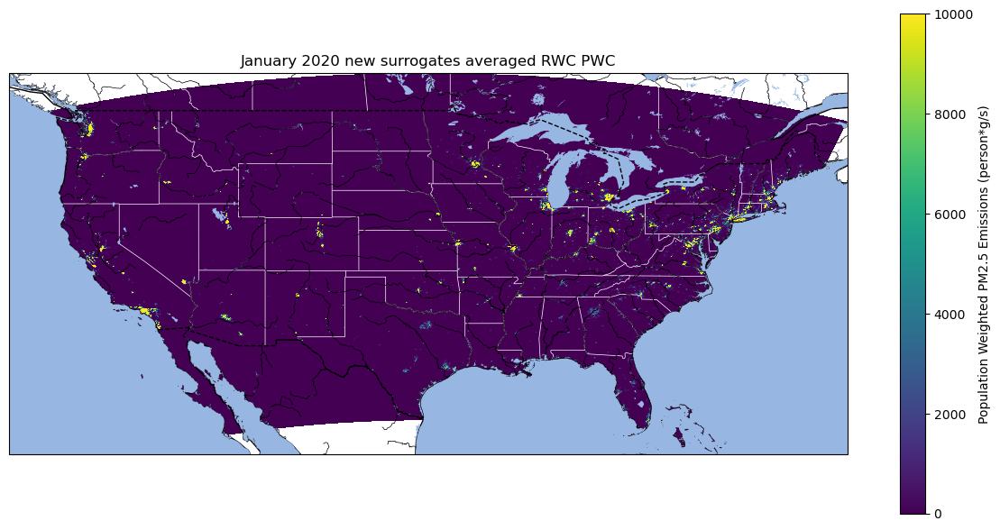

In [141]:
plot(data = pwc_2020_new_surg,
     vs = [0,10000],
     label =  "Population Weighted PM2.5 Emissions (person*g/s)", 
     title = "January 2020 new surrogates averaged RWC PWC",
     lon = lon,
     lat = lat,
     #counties = True,
    )

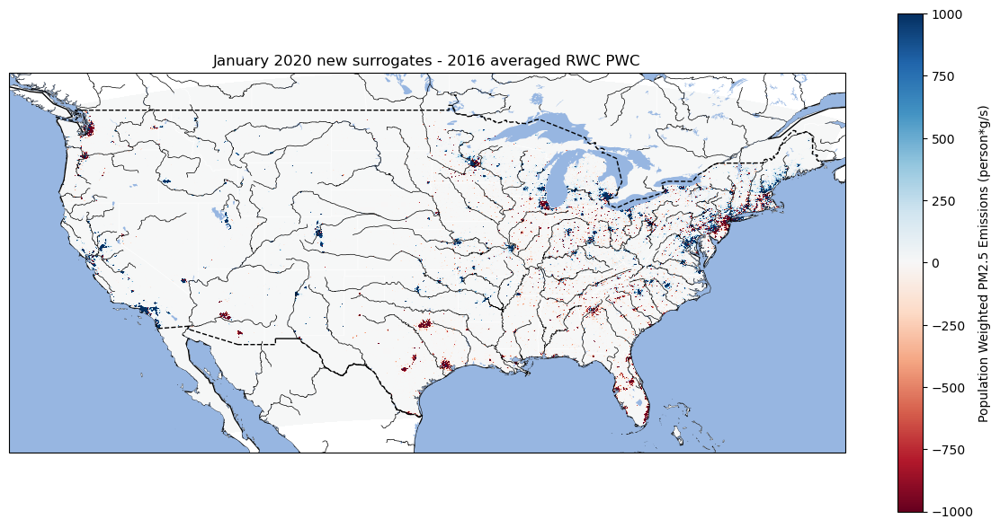

In [143]:
plot(data = pwc_2020_new_surg - pwc_2016,
     vs = [-1000,1000],
     label =  "Population Weighted PM2.5 Emissions (person*g/s)", 
     title = "January 2020 new surrogates - 2016 averaged RWC PWC",
     lon = lon,
     lat = lat,
     counties = False,
     difference = True,
    )

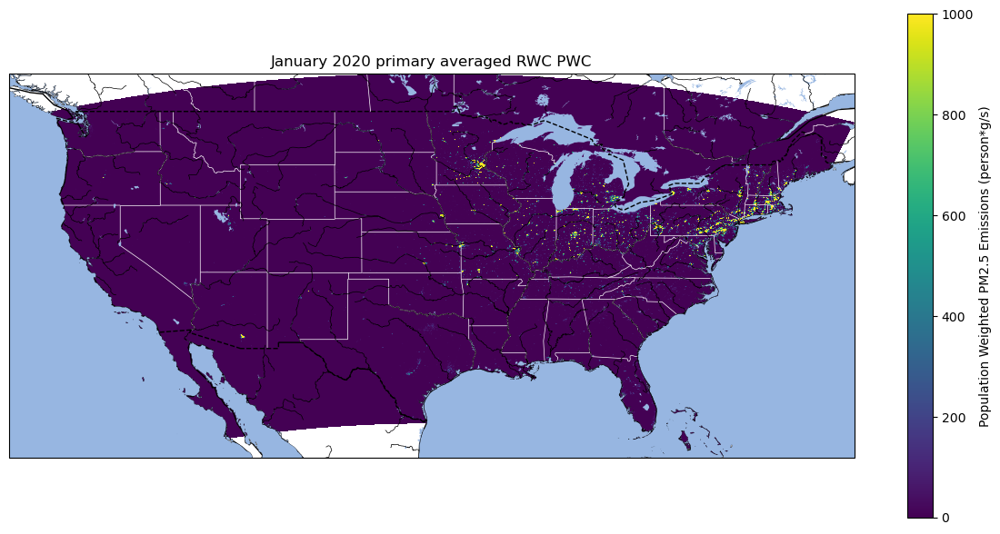

In [144]:
plot(data = pwc_2016_primary,
     vs = [0,1000],
     label =  "Population Weighted PM2.5 Emissions (person*g/s)", 
     title = "January 2020 primary averaged RWC PWC",
     lon = lon,
     lat = lat,
     #counties = True,
    )

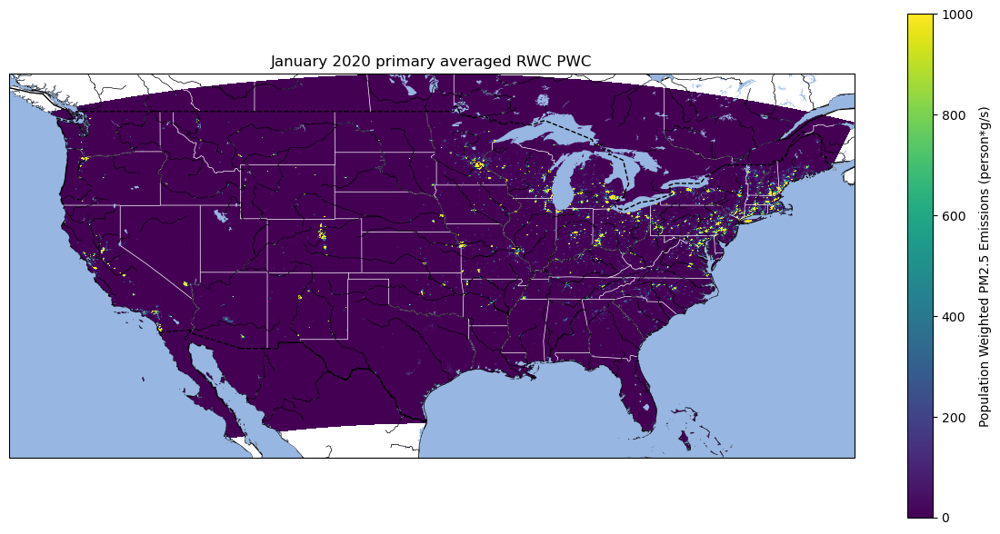

In [145]:
plot(data = pwc_2020_primary,
     vs = [0,1000],
     label =  "Population Weighted PM2.5 Emissions (person*g/s)", 
     title = "January 2020 primary averaged RWC PWC",
     lon = lon,
     lat = lat,
     #counties = True,
    )

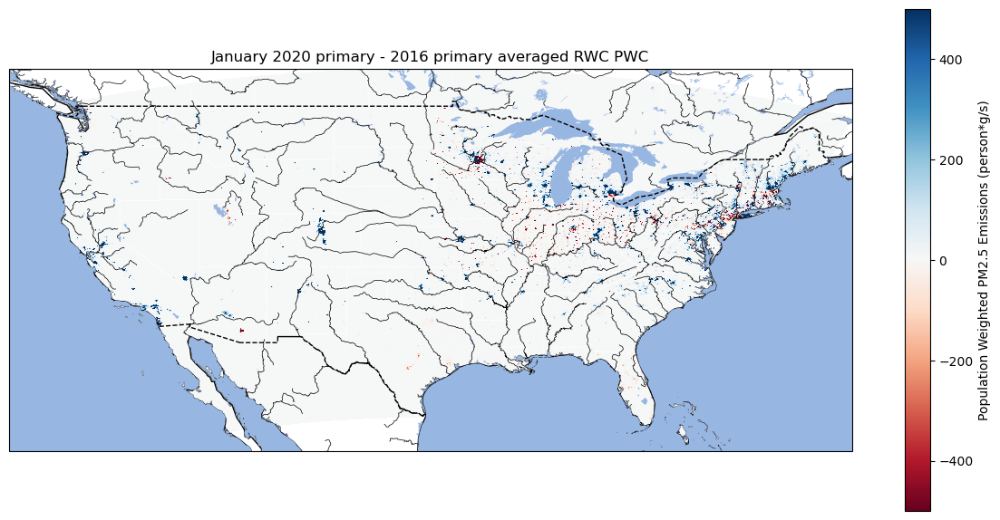

In [146]:
plot(data = pwc_2020_primary - pwc_2016_primary,
     vs = [-500,500],
     label =  "Population Weighted PM2.5 Emissions (person*g/s)", 
     title = "January 2020 primary - 2016 primary averaged RWC PWC",
     lon = lon,
     lat = lat,
     counties = False,
     difference = True,
    )

#### Percent Plots

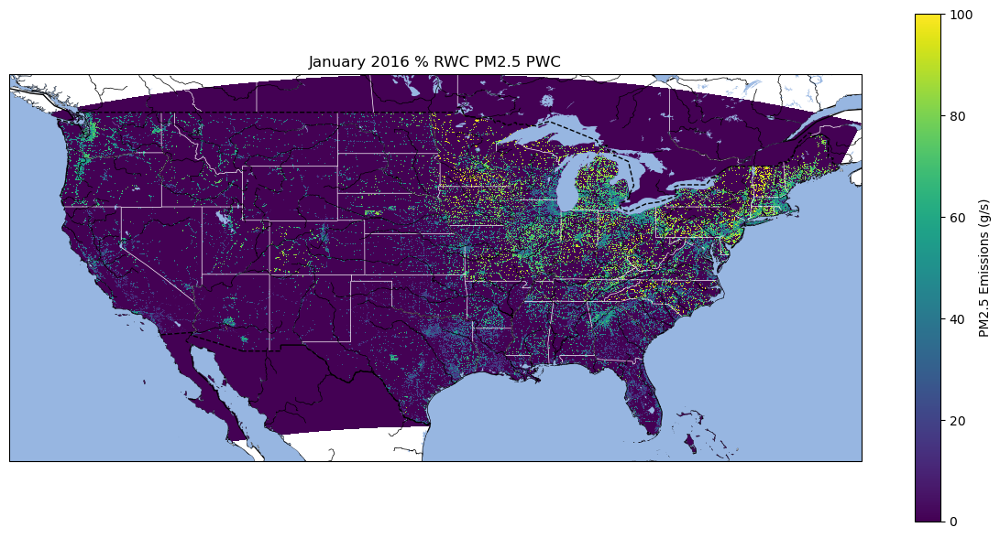

In [125]:
plot(data = pwc_2016_percent,
     vs = [0,100],
     label =  "PM2.5 Emissions (g/s)", 
     title = "January 2016 % RWC PM2.5 PWC",
     lon = lon,
     lat = lat,
     counties = False,
    )

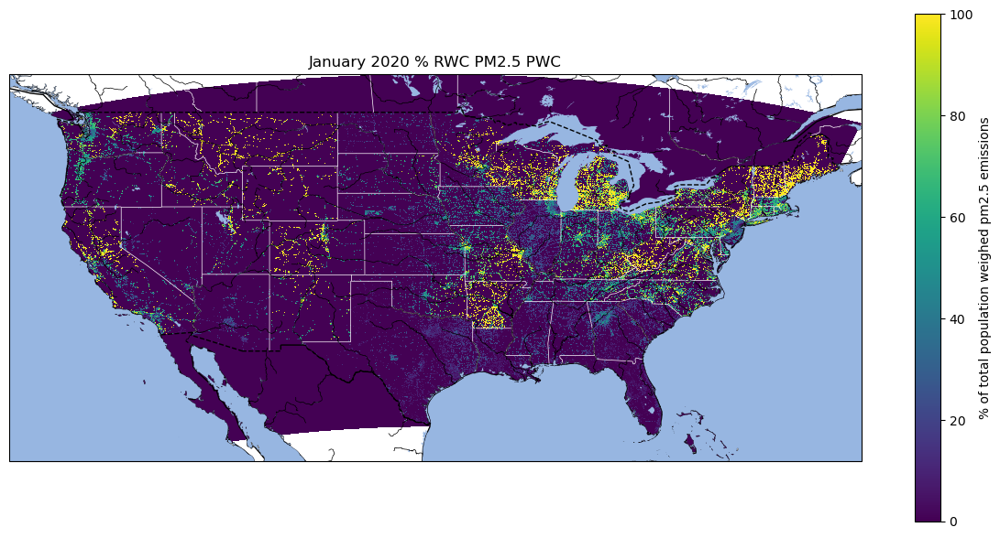

In [126]:
plot(data = pwc_2020_percent,
     vs = [0,100],
     label =  "% of total population weighed pm2.5 emissions", 
     title = "January 2020 % RWC PM2.5 PWC",
     lon = lon,
     lat = lat,
     counties = False,
    )

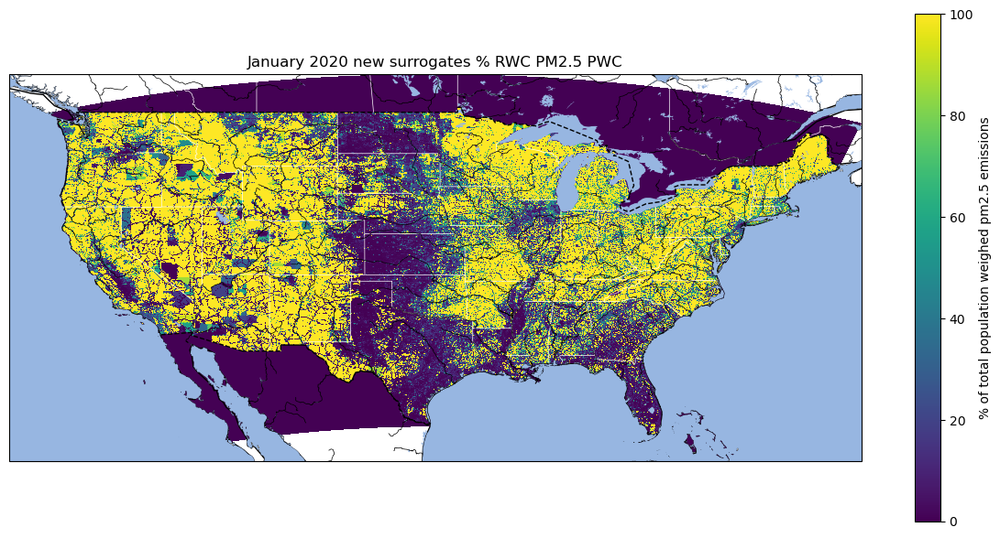

In [127]:
plot(data = pwc_2020_new_surg_percent,
     vs = [0,100],
     label =  "% of total population weighed pm2.5 emissions", 
     title = "January 2020 new surrogates % RWC PM2.5 PWC",
     lon = lon,
     lat = lat,
     counties = False,
    )

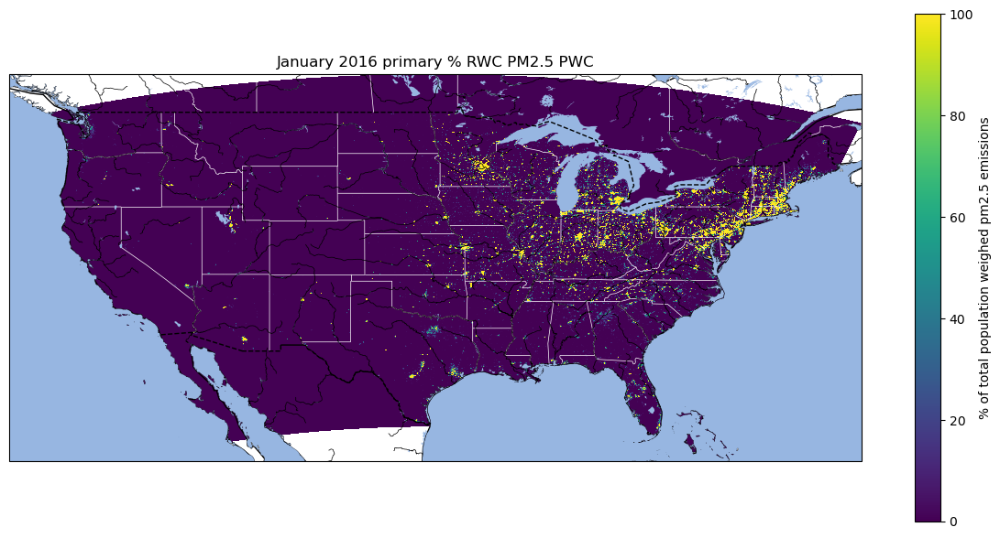

In [128]:
plot(data = pwc_2016_primary,
     vs = [0,100],
     label =  "% of total population weighed pm2.5 emissions", 
     title = "January 2016 primary % RWC PM2.5 PWC",
     lon = lon,
     lat = lat,
     counties = False,
    )

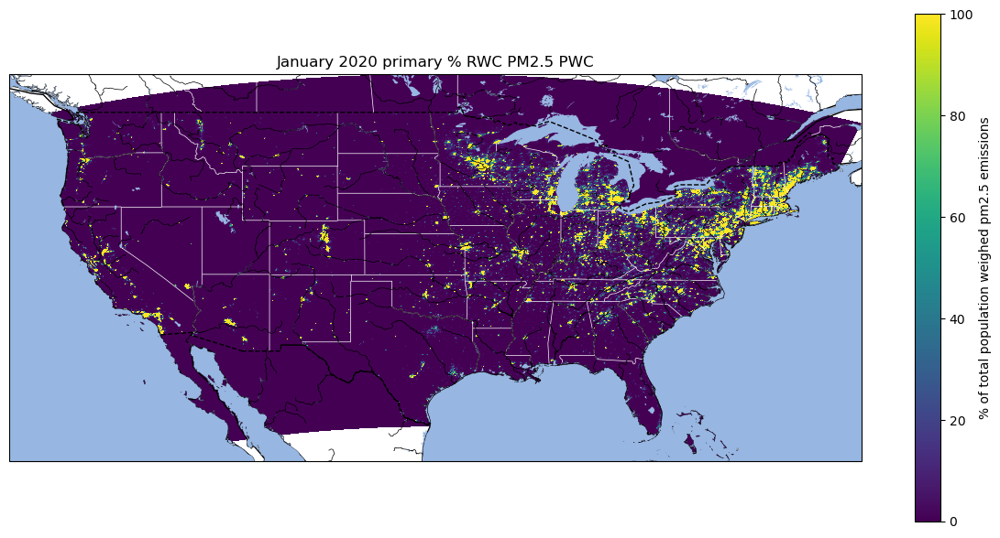

In [129]:
plot(data = pwc_2020_primary,
     vs = [0,100],
     label =  "% of total population weighed pm2.5 emissions", 
     title = "January 2020 primary % RWC PM2.5 PWC",
     lon = lon,
     lat = lat,
     counties = False,
    )

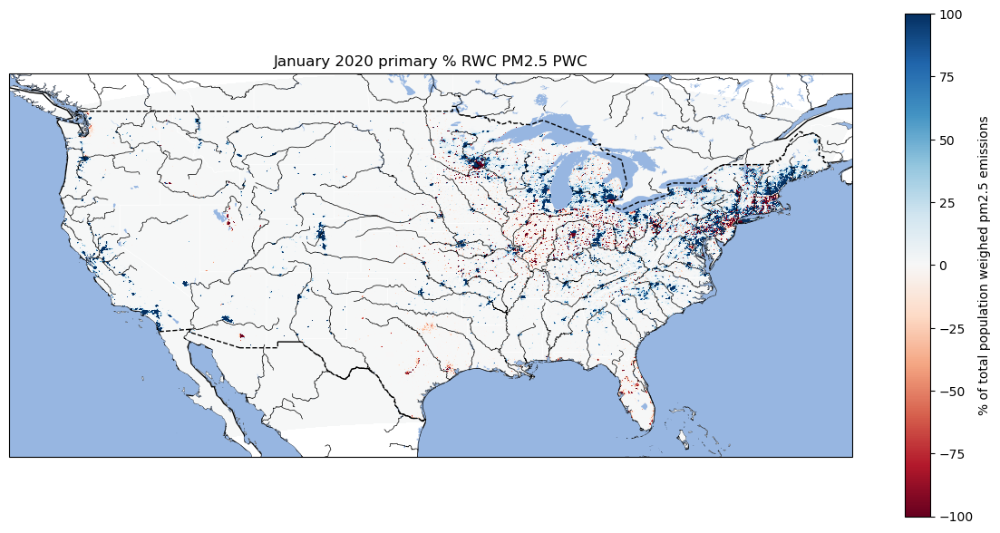

In [130]:
plot(data = pwc_2020_primary - pwc_2016_primary,
     vs = [-100,100],
     label =  "% of total population weighed pm2.5 emissions", 
     title = "January 2020 primary % RWC PM2.5 PWC",
     lon = lon,
     lat = lat,
     counties = False,
     difference = True,
    )

# Population characteristics

In [37]:
import pandas as pd 
EJ_index = pd.read_csv('../WRF_analyses/EJ_index.csv')

In [15]:
# import geopandas as gpd
# rwc_census_tract_pm25 = gpd.read_file('../WRF_analyses/census_tract_data/2016_rwc_census_tract_pm25.shp')
# rwc_census_tract_pm25 = rwc_census_tract_pm25.rename(columns={
#            "White alon":    "White",
#            "Black or A":    "Black",
#            "American I":    "American Indian",
#            "Asian alon":    "Asian",
#            "Native Haw":    "Native Hawaiian or Pacific Islander",
#            'Some Other': 'Other', 
#            'Two or Mor': 'Two or More Races',
#            'Hispanic o': 'Hispanic'
#                    })

# rwc_census_tract_pm25['GEOID_x'] = rwc_census_tract_pm25['GEOID_x'].astype(int)
# rwc_census_tract_pm25 = rwc_census_tract_pm25.merge(EJ_index[['GEOID', 'SPL_EJI']], left_on='GEOID_x', right_on='GEOID', how='left')
# rwc_census_tract_pm25['COUNTYFP'] = rwc_census_tract_pm25['COUNTYFP'].astype(int)

# cbsa_counties = pd.read_excel('cbsa/cbsa_counties.xlsx', header = 2)
# cbsa_counties.dropna(subset=['FIPS County Code'], inplace=True)
# cbsa_counties['FIPS County Code'] = cbsa_counties['FIPS County Code'].astype(int)

# rwc_census_tract_pm25 = rwc_census_tract_pm25.merge(cbsa_counties[['CBSA Title', 'County/County Equivalent']], 
#                                   left_on = "COUNTY", 
#                                   right_on = 'County/County Equivalent', 
#                                   how = 'inner')


KeyboardInterrupt



In [38]:
tract_emissions = gpd.read_file('../WRF_analyses/census_tract_emissions_only_data/census_tract_pm25_emissions.shp')
census_data = pd.read_csv("../WRF_analyses/census_tract_race.csv", encoding = "latin1")
rwc_census_tract_pm25 = tract_emissions.merge(census_data, left_on='GISJOIN', right_on='GISJOIN', how='left')

In [39]:
rwc_census_tract_pm25['GEOID_x'] = rwc_census_tract_pm25['GEOID_x'].astype(int)
rwc_census_tract_pm25 = rwc_census_tract_pm25.merge(EJ_index[['GEOID', 'SPL_EJI']], left_on='GEOID_x', right_on='GEOID', how='left')
rwc_census_tract_pm25['COUNTYFP'] = rwc_census_tract_pm25['COUNTYFP'].astype(int)

cbsa_counties = pd.read_excel('../WRF_analyses/cbsa/cbsa_counties.xlsx', header = 2)
cbsa_counties.dropna(subset=['FIPS County Code'], inplace=True)
cbsa_counties['FIPS County Code'] = cbsa_counties['FIPS County Code'].astype(int)

rwc_census_tract_pm25 = rwc_census_tract_pm25.merge(cbsa_counties[['CBSA Title', 'County/County Equivalent']], 
                                  left_on = "COUNTY", 
                                  right_on = 'County/County Equivalent', 
                                  how = 'inner')

In [40]:
rwc_census_tract_pm25 = rwc_census_tract_pm25.rename(columns={
           "ALUKE001":    "Total",
           "ALUKE003":    "White",
           "ALUKE004":    "Black",
           "ALUKE005":    "American Indian",
           "ALUKE006":    "Asian",
           "ALUKE007":    "Native Hawaiian and Other Pacific Islander",
           "ALUKE008":    "Some Other Race",
           "ALUKE009":    "Two or More Races",
           "ALUKE010":    "Two or More Races: Two races including Some Other Race",
           "ALUKE011":    "Two or More Races: Two races excluding Some Other Race, and three or more races",
           'ALUKE012': 'Hispanic or Latino',
           'ALUKE013': 'Hispanic or Latino: White alone',
           'ALUKE014': 'Hispanic or Latino: Black or African American alone',
           'ALUKE015': 'Hispanic or Latino: American Indian and Alaska Native alone',
           'ALUKE016': 'Hispanic or Latino: Asian alone',
           'ALUKE017': 'Hispanic or Latino: Native Hawaiian and Other Pacific Islander alone',
           'ALUKE018': 'Hispanic or Latino: Some other race alone',
           'ALUKE019': 'Hispanic or Latino: Two or more races',
           'ALUKE020': 'Hispanic or Latino: Two or more races: Two races including Some other race',
           'ALUKE021': 'Hispanic or Latino: Two or more races: Two races excluding Some other race, and three or more races'
                   })

In [41]:
list(rwc_census_tract_pm25.columns)

['GISJOIN',
 'per_2020_n',
 'per_2020',
 'per_2016',
 'STATEFP',
 'COUNTYFP',
 'TRACTCE',
 'GEOID_x',
 'NAME',
 'NAMELSAD',
 'MTFCC',
 'FUNCSTAT',
 'ALAND',
 'AWATER',
 'INTPTLAT',
 'INTPTLON',
 'Shape_Leng',
 'Shape_Area',
 '2020_new_p',
 '2020_per_a',
 '2016_per_a',
 'geometry',
 'YEAR',
 'STUSAB',
 'REGIONA',
 'DIVISIONA',
 'STATE',
 'STATEA',
 'COUNTY',
 'COUNTYA',
 'COUSUBA',
 'PLACEA',
 'TRACTA',
 'BLKGRPA',
 'CONCITA',
 'AIANHHA',
 'RES_ONLYA',
 'TRUSTA',
 'AIHHTLI',
 'AITSCEA',
 'ANRCA',
 'CBSAA',
 'CSAA',
 'METDIVA',
 'NECTAA',
 'CNECTAA',
 'NECTADIVA',
 'UAA',
 'CDCURRA',
 'SLDUA',
 'SLDLA',
 'ZCTA5A',
 'SUBMCDA',
 'SDELMA',
 'SDSECA',
 'SDUNIA',
 'PCI',
 'PUMAA',
 'GEOID_y',
 'BTTRA',
 'BTBGA',
 'NAME_E',
 'Total',
 'ALUKE002',
 'White',
 'Black',
 'American Indian',
 'Asian',
 'Native Hawaiian and Other Pacific Islander',
 'Some Other Race',
 'Two or More Races',
 'Two or More Races: Two races including Some Other Race',
 'Two or More Races: Two races excluding Some Other R

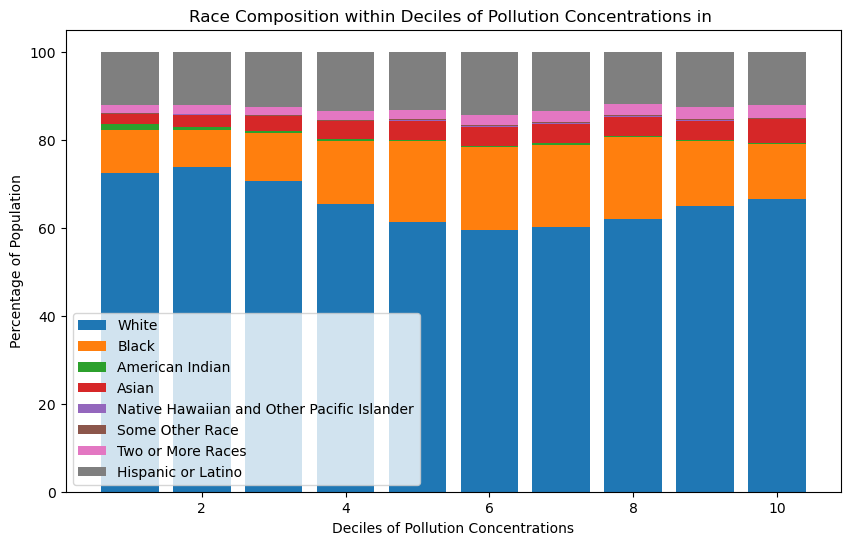

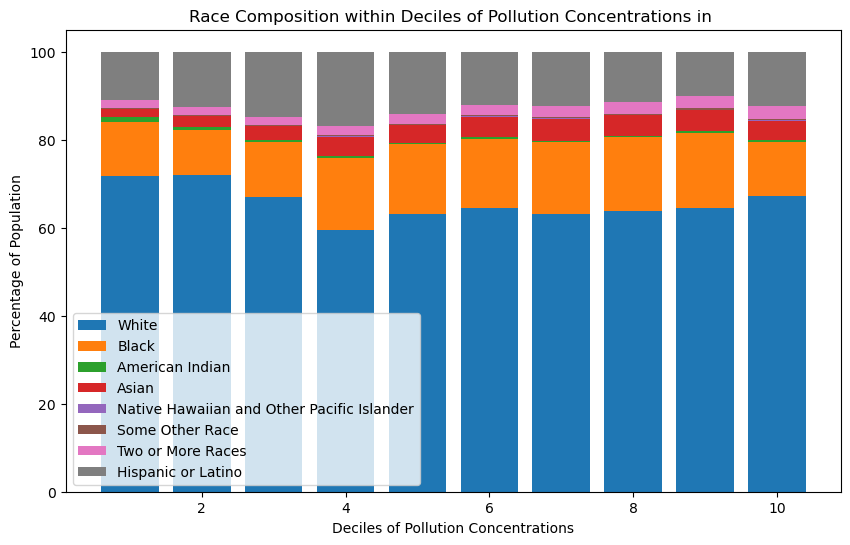

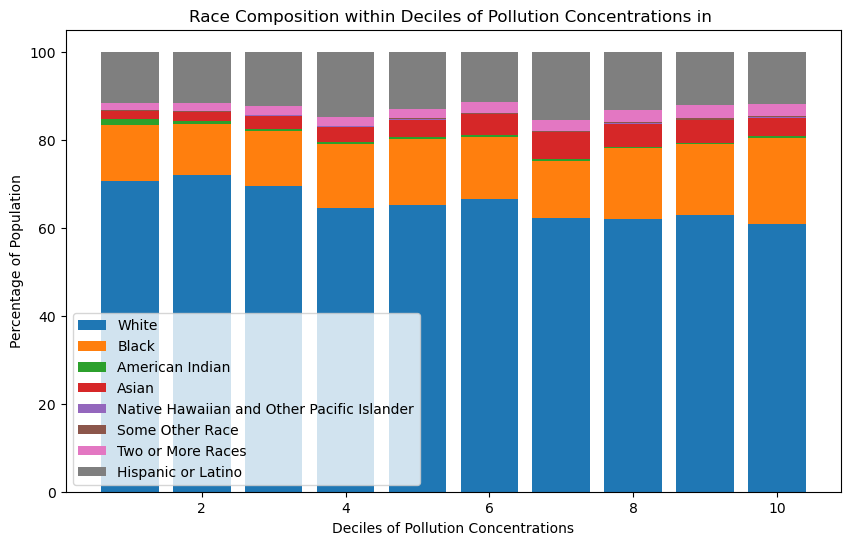

In [42]:
import geopandas as gpd
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd


def decile_plot(df, loc = "", col = "2016_per_a"):
    num_iles = 10
    
    if loc:
        city_index  = df[df['CBSA Title'] == loc].index
        city_tracts = df.loc[city_index]
        df = city_tracts

    # Calculate deciles of pollution concentrations
    df['pm25_decile'] = pd.qcut(df[col], q=num_iles, labels=False)

    # Calculate the percentage of each race within each decile
    race_columns = [ "White",   "Black",   "American Indian",   "Asian",  "Native Hawaiian and Other Pacific Islander",'Some Other Race', 'Two or More Races','Hispanic or Latino']  # Assuming these are the columns representing race

    for race in race_columns:
        df[race + '_percentage'] = (df[race] / df['Total']) * 100


    #Create a bar plot with each bar representing a decile and colored by race percentages
    plt.figure(figsize=(10, 6))
    bottom = np.zeros(len(df['pm25_decile'].unique()))

    for i, race in enumerate(race_columns):
        race_percentages = [df[df['pm25_decile'] == decile][race + '_percentage'].mean() for decile in range(num_iles)]
        plt.bar(range(1,num_iles+1), race_percentages, bottom=bottom, label=race)
        bottom += np.array(race_percentages)
    plt.xlabel('Deciles of Pollution Concentrations')
    plt.ylabel('Percentage of Population')
    plt.title(f"Race Composition within Deciles of Pollution Concentrations in {loc}")
    plt.legend()
    plt.show()

decile_plot(rwc_census_tract_pm25, "", col = "2016_per_a")
decile_plot(rwc_census_tract_pm25, "", col = "2020_per_a")
decile_plot(rwc_census_tract_pm25, "", col = "2020_new_p")

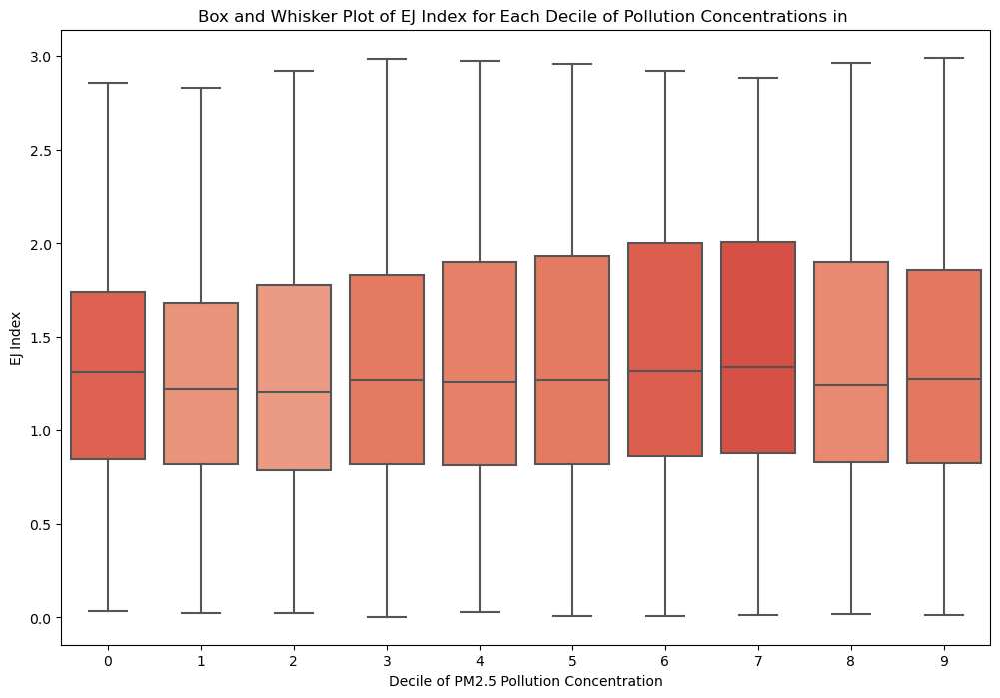

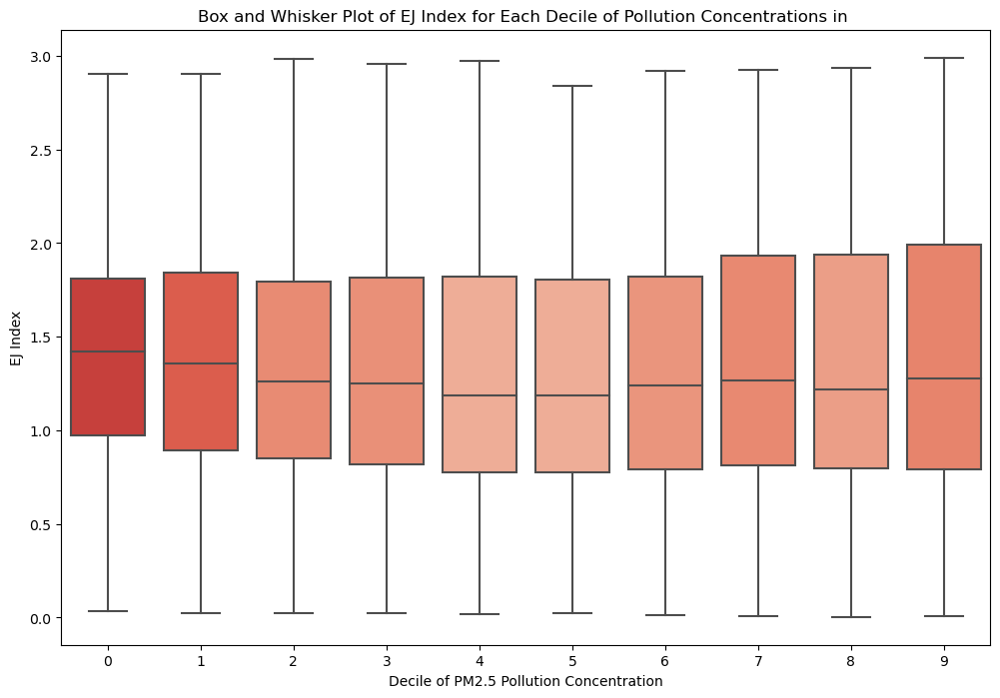

In [45]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

def box_whisker(df, location = "", col = "concentrat", index_col = "SPL_EJI", num_iles = 10):

    if location:
        city_index  = df[df['CBSA Title'] == location].index
        city_tracts = df.loc[city_index]
        df = city_tracts
    
    # Create deciles for pollution concentrations
    num_iles = 10
    df['decile'] = pd.qcut(df[col], q=num_iles, labels=False)

    # create colors
    mean_ej_index = df.groupby('decile')[index_col].median()
    
    # Normalize the mean EJ_index values to get colors
    norm = plt.Normalize(mean_ej_index.min() - 0.2, mean_ej_index.max() + 0.2)
    cmap = plt.get_cmap('Reds')
    colors = [cmap(norm(value)) for value in mean_ej_index]
    
    # Create the box and whisker plot
    plt.figure(figsize=(12, 8))
    sns.boxplot(x='decile', y=index_col, data=df, palette = colors)
    plt.xlabel('Decile of PM2.5 Pollution Concentration')
    plt.ylabel('EJ Index')
    plt.title(f"Box and Whisker Plot of EJ Index for Each Decile of Pollution Concentrations in {location}")
    plt.show()
    
box_whisker(rwc_census_tract_pm25, col = "2016_per_a")
box_whisker(rwc_census_tract_pm25,col = "2020_new_p")

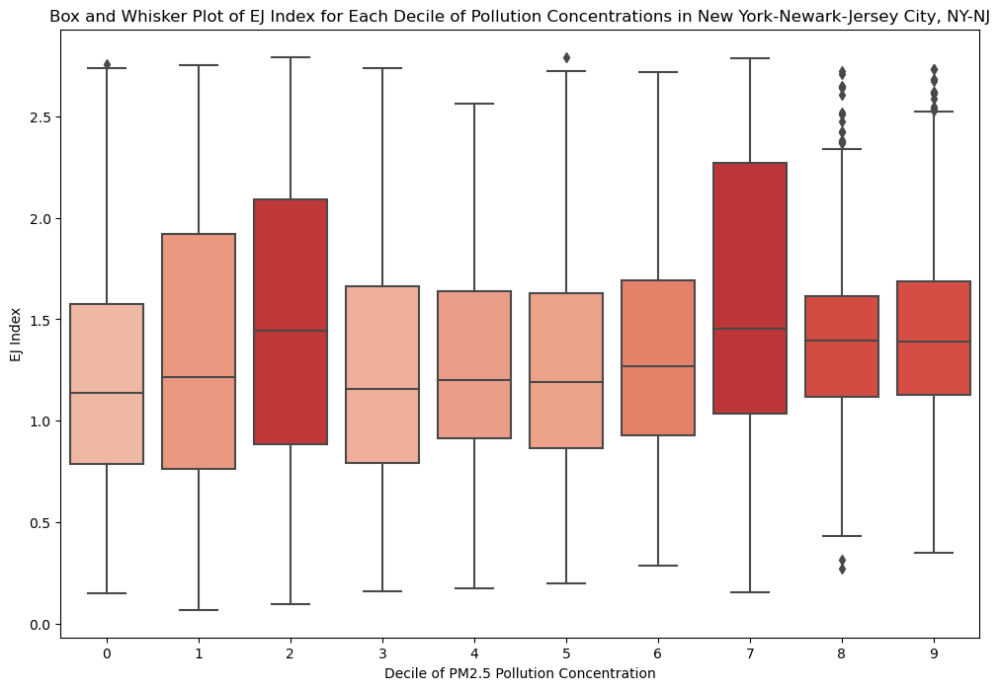

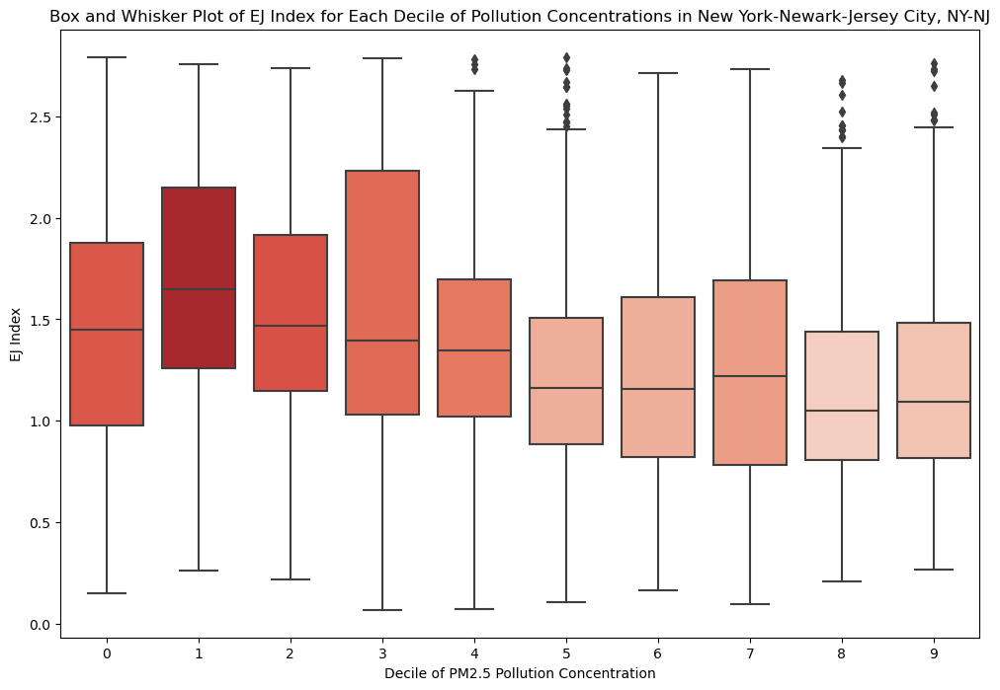

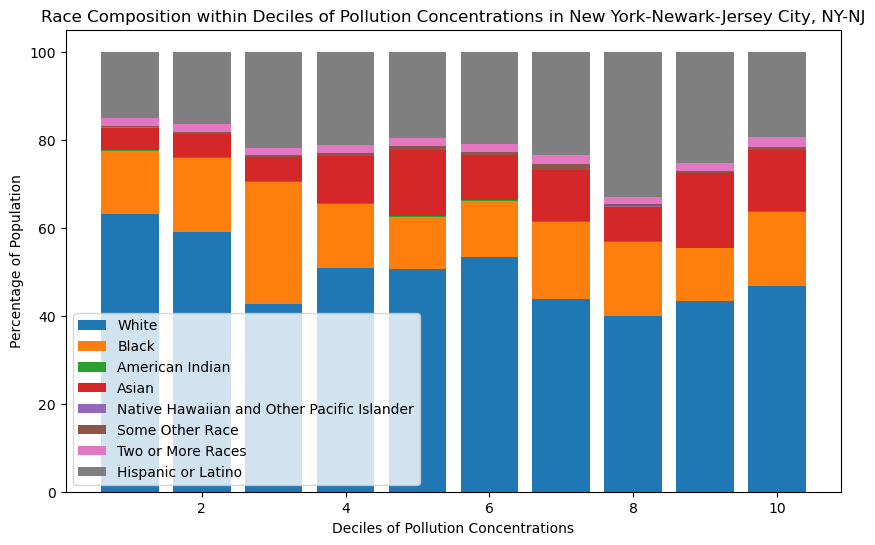

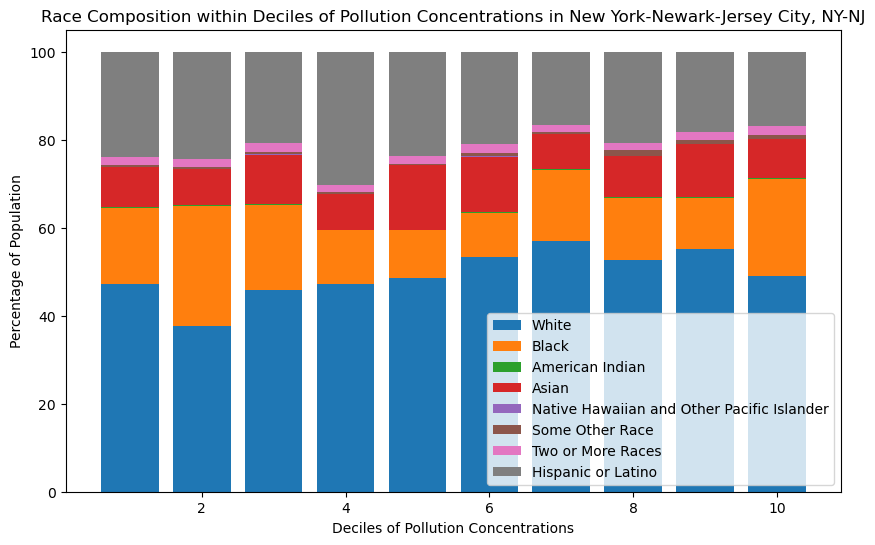

In [46]:
box_whisker(rwc_census_tract_pm25, location = 'New York-Newark-Jersey City, NY-NJ', col = "2016_per_a")
box_whisker(rwc_census_tract_pm25, location = 'New York-Newark-Jersey City, NY-NJ', col = "2020_new_p")

decile_plot(rwc_census_tract_pm25, loc = 'New York-Newark-Jersey City, NY-NJ',  col = "2016_per_a")
decile_plot(rwc_census_tract_pm25, loc = 'New York-Newark-Jersey City, NY-NJ',  col = "2020_new_p")

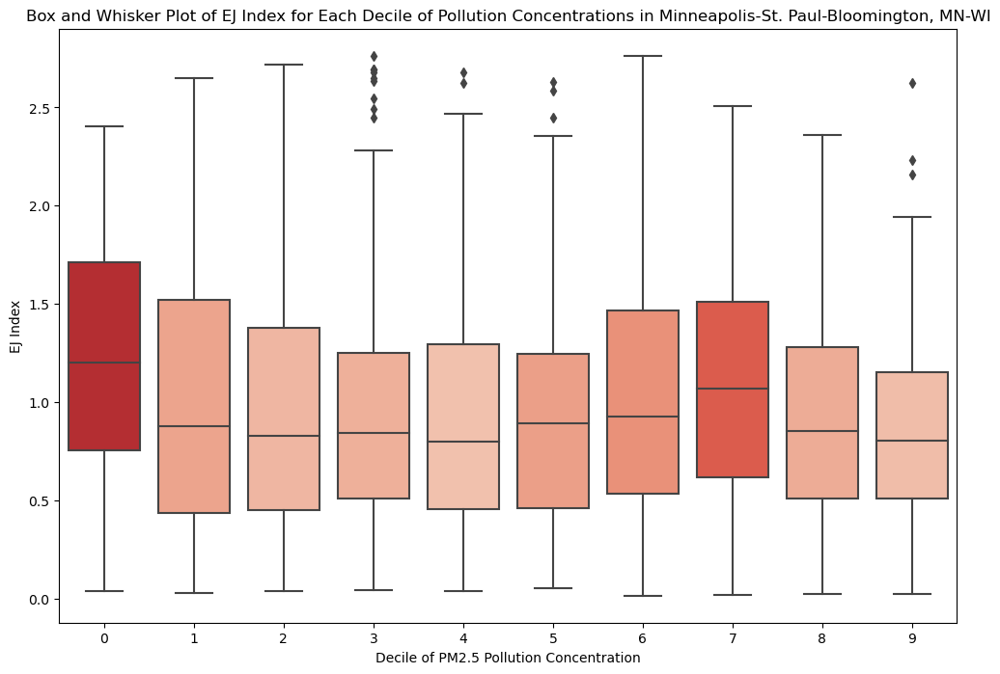

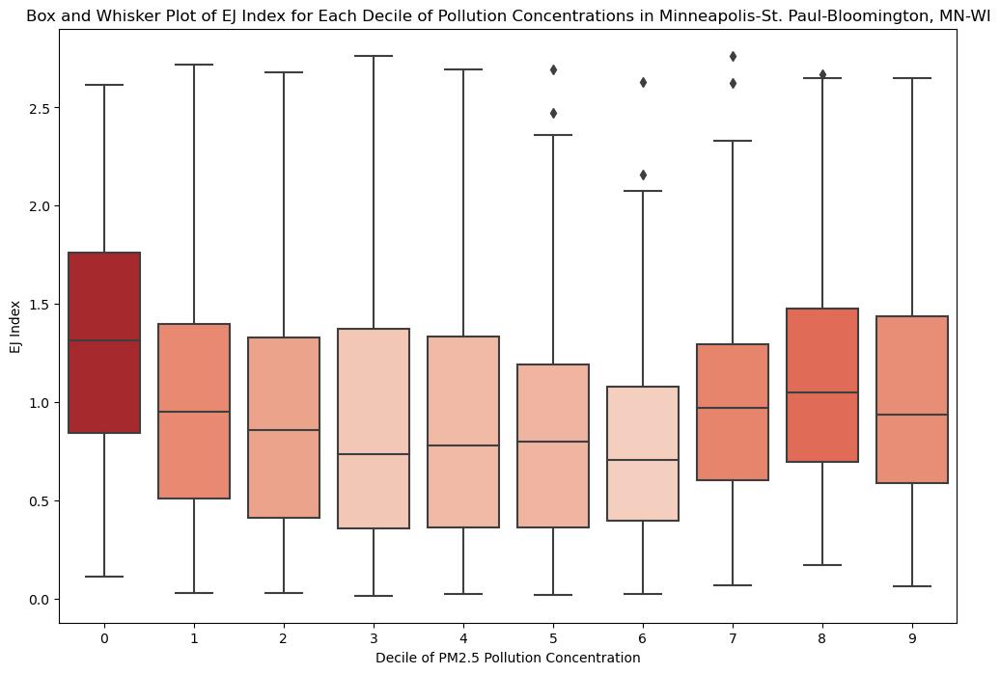

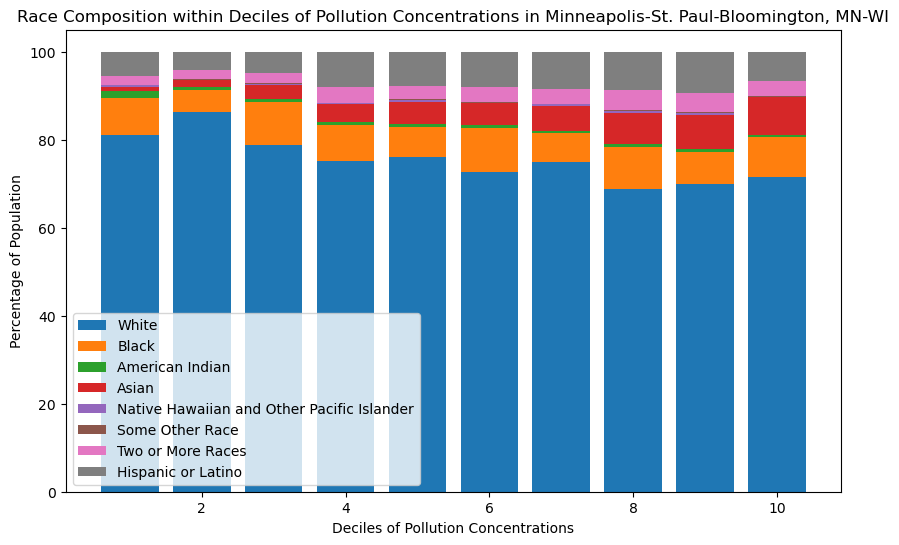

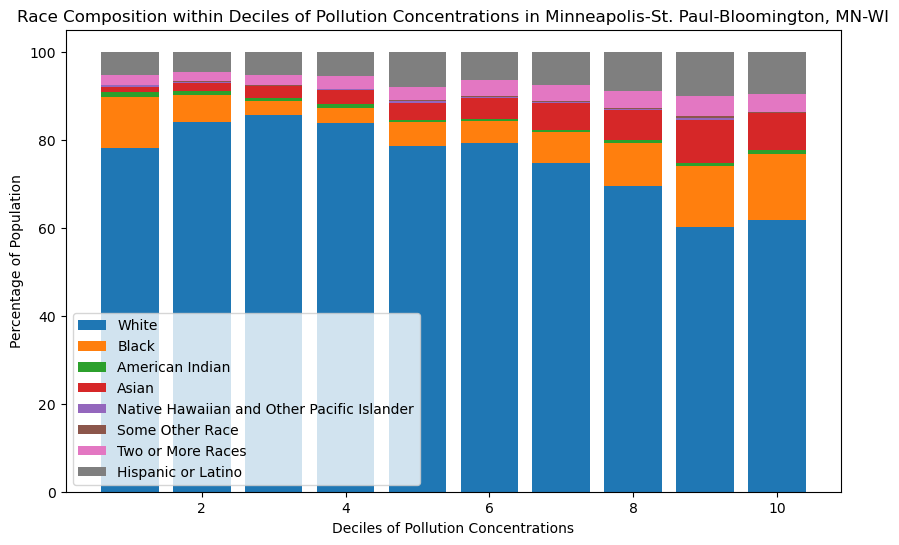

In [47]:
box_whisker(rwc_census_tract_pm25, location = 'Minneapolis-St. Paul-Bloomington, MN-WI', col = "2016_per_a")
box_whisker(rwc_census_tract_pm25, location = 'Minneapolis-St. Paul-Bloomington, MN-WI', col = "2020_new_p")

decile_plot(rwc_census_tract_pm25,      loc = 'Minneapolis-St. Paul-Bloomington, MN-WI',  col = "2016_per_a")
decile_plot(rwc_census_tract_pm25,      loc = 'Minneapolis-St. Paul-Bloomington, MN-WI',  col = "2020_new_p")

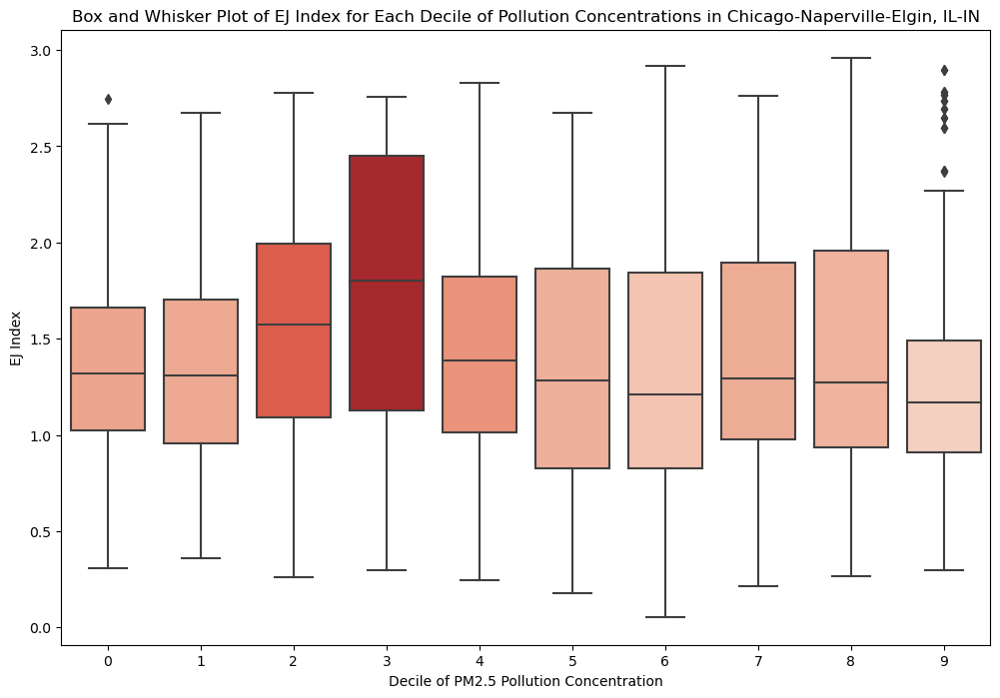

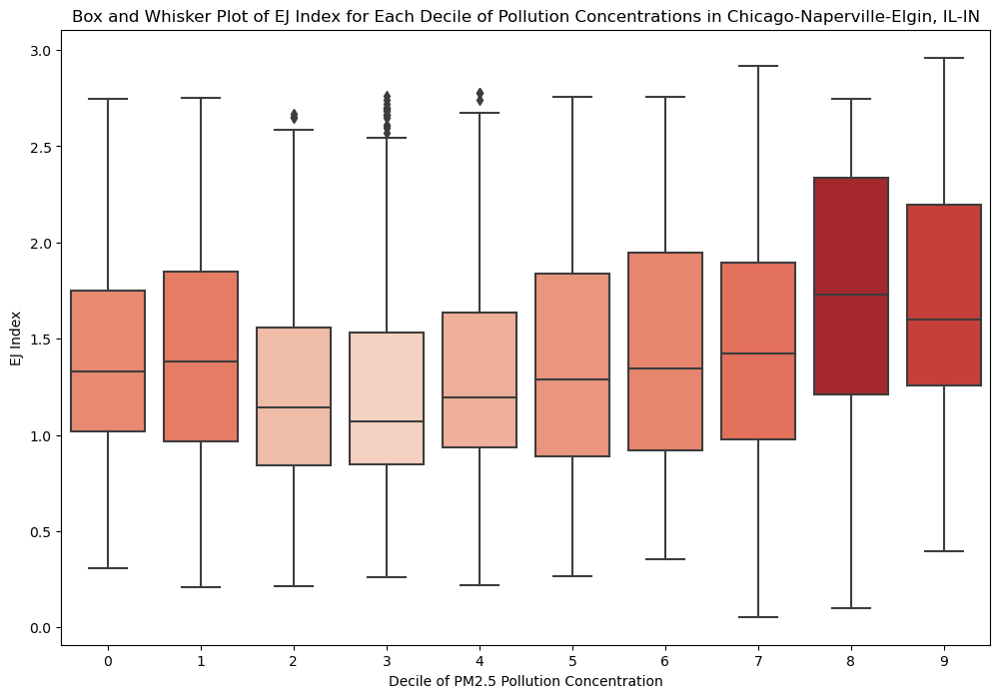

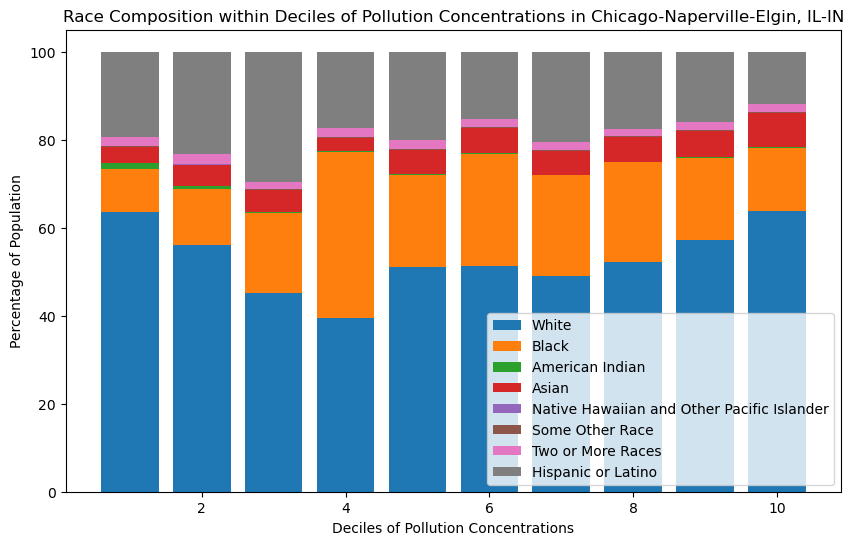

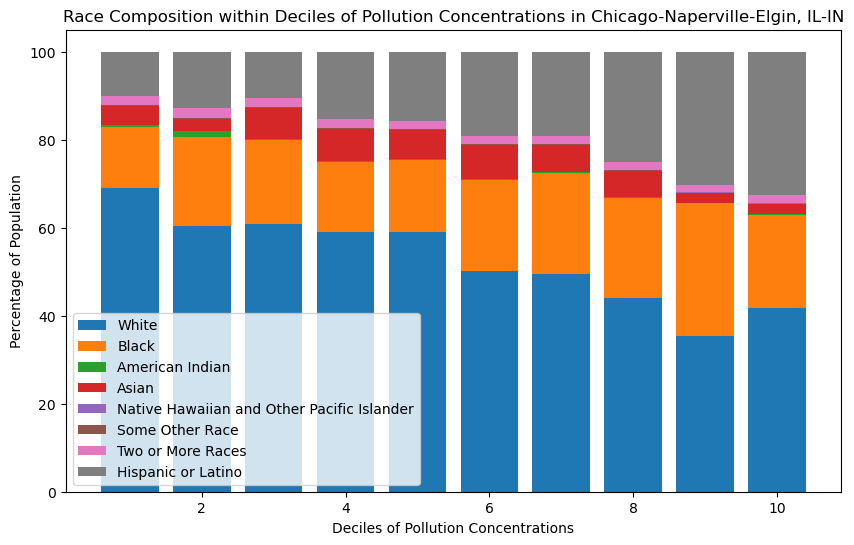

In [52]:
box_whisker(rwc_census_tract_pm25, location = 'Chicago-Naperville-Elgin, IL-IN', col = "2016_per_a")
box_whisker(rwc_census_tract_pm25, location = 'Chicago-Naperville-Elgin, IL-IN', col = "2020_new_p")

decile_plot(rwc_census_tract_pm25,      loc = 'Chicago-Naperville-Elgin, IL-IN',  col = "2016_per_a")
decile_plot(rwc_census_tract_pm25,      loc = 'Chicago-Naperville-Elgin, IL-IN',  col = "2020_new_p")

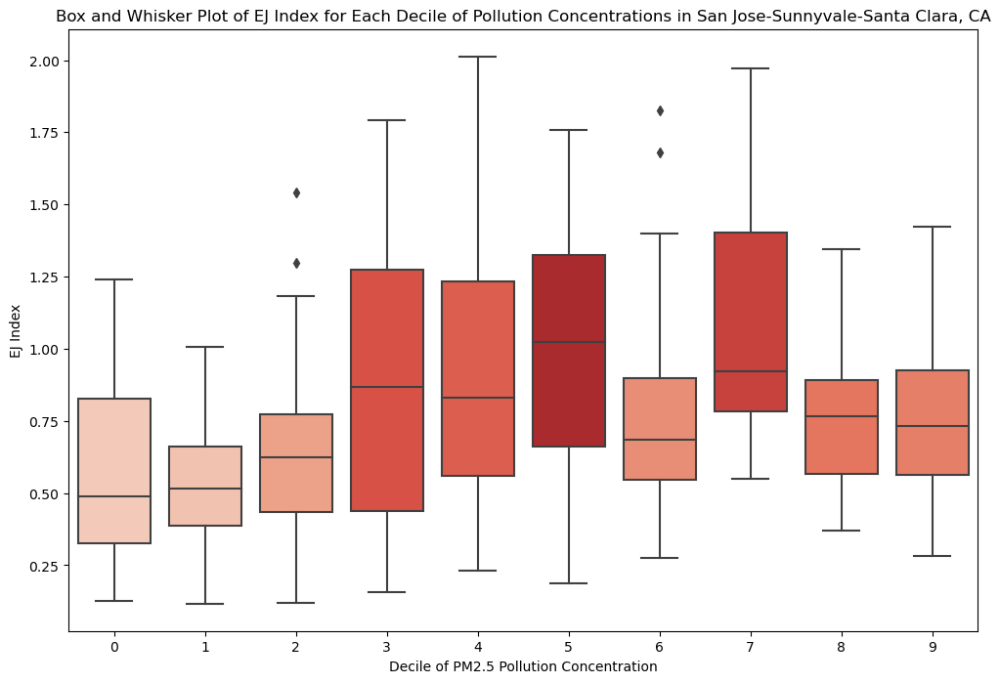

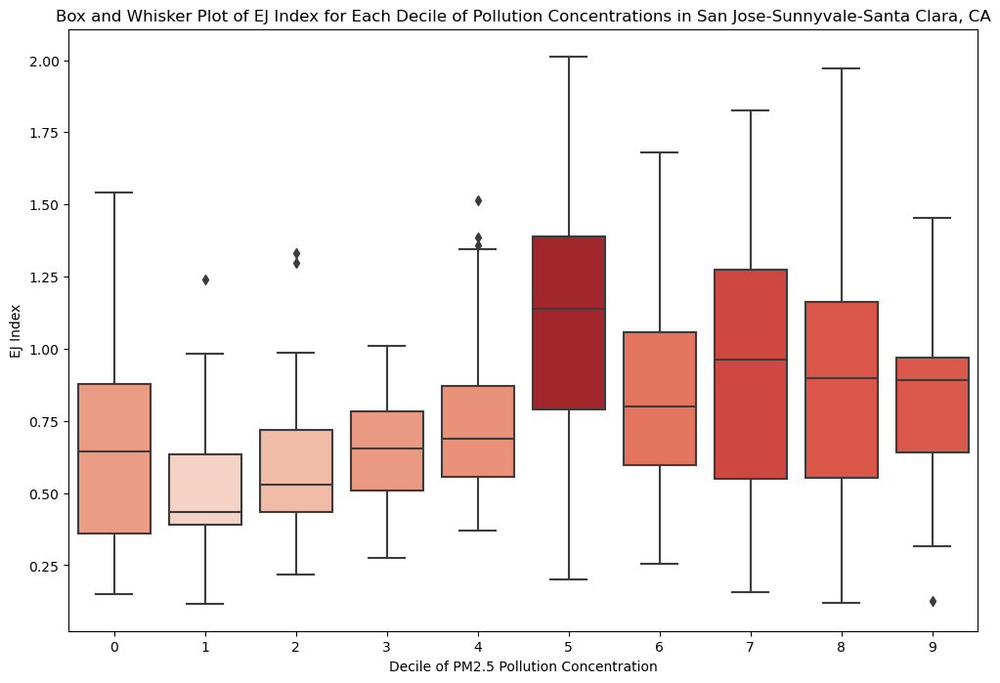

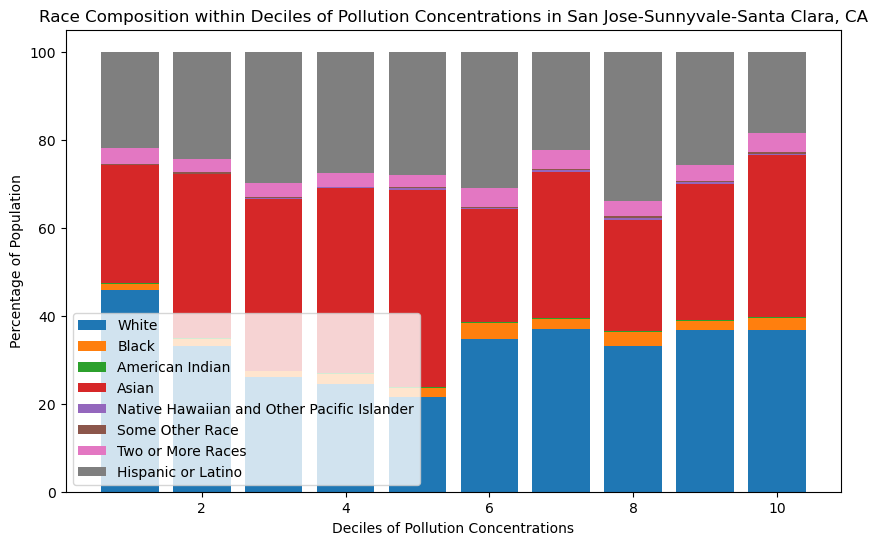

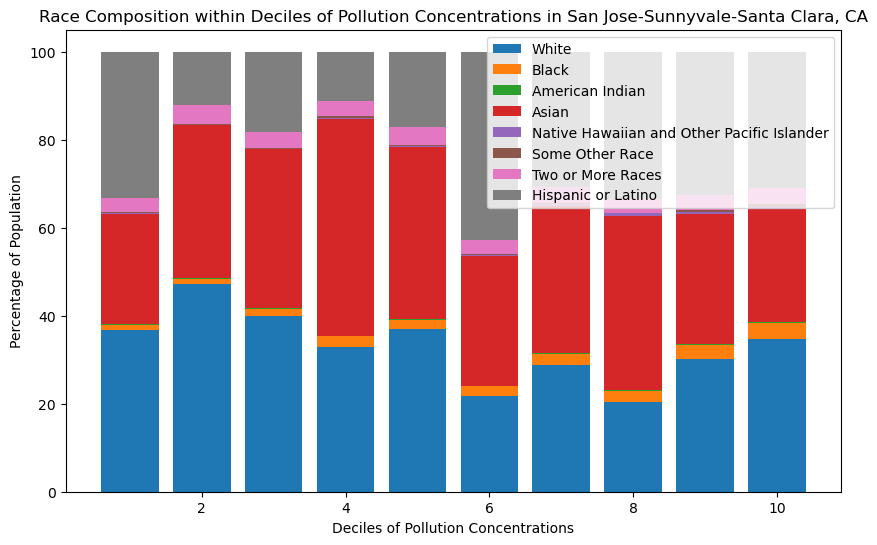

In [53]:
box_whisker(rwc_census_tract_pm25, location = 'San Jose-Sunnyvale-Santa Clara, CA', col = "2016_per_a")
box_whisker(rwc_census_tract_pm25, location = 'San Jose-Sunnyvale-Santa Clara, CA', col = "2020_new_p")

decile_plot(rwc_census_tract_pm25,      loc = 'San Jose-Sunnyvale-Santa Clara, CA',  col = "2016_per_a")
decile_plot(rwc_census_tract_pm25,      loc = 'San Jose-Sunnyvale-Santa Clara, CA',  col = "2020_new_p")

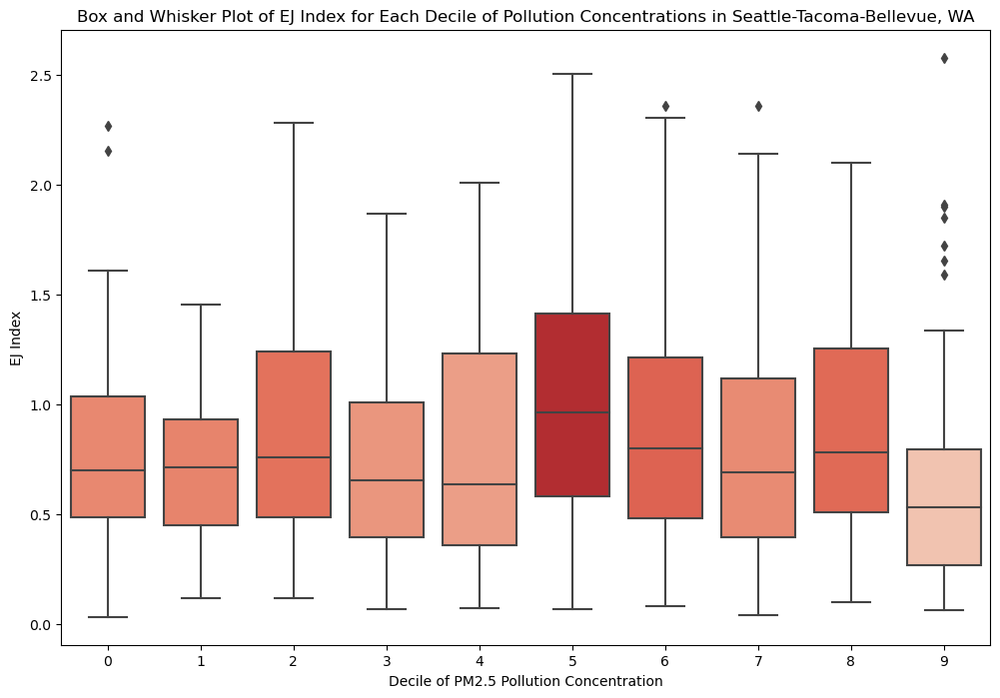

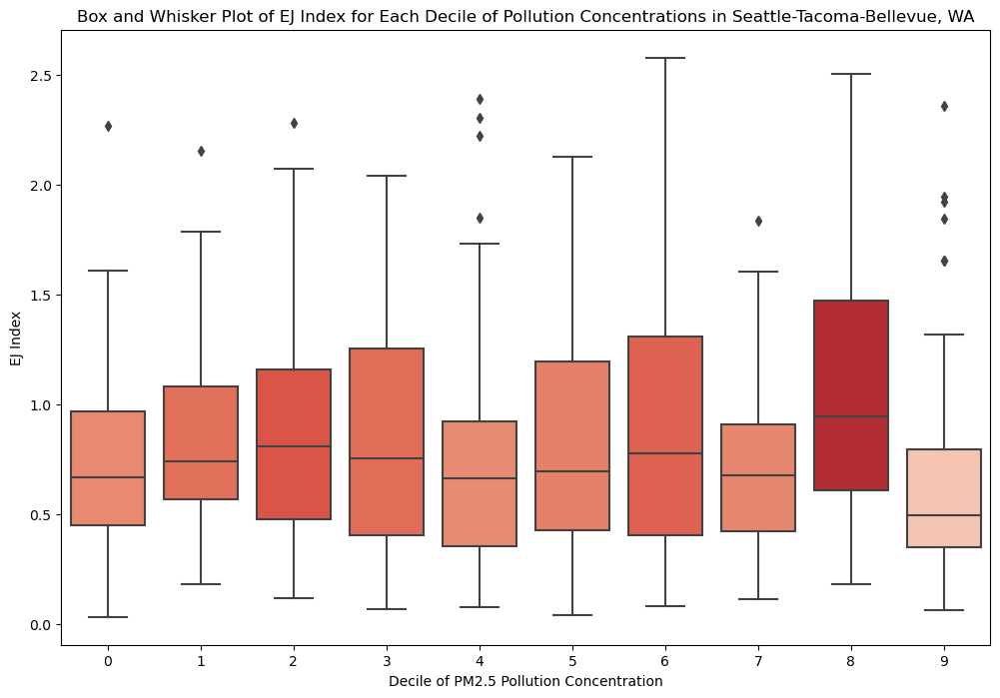

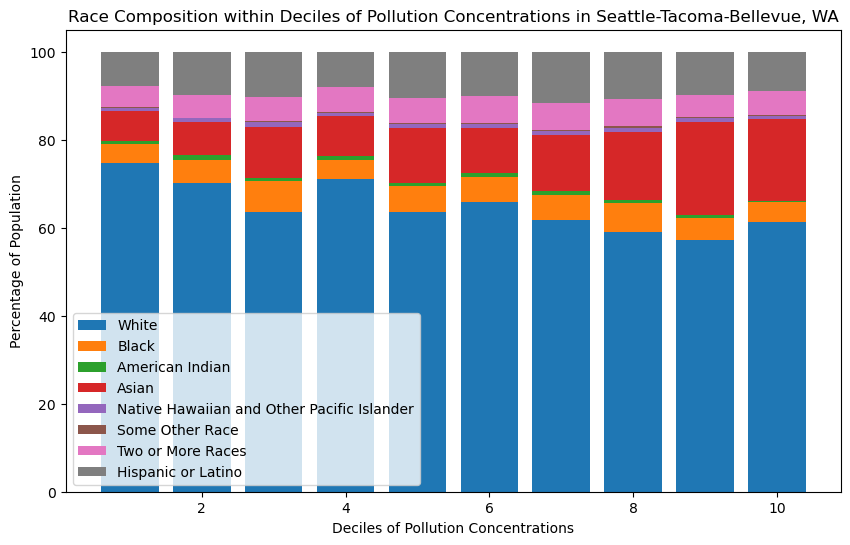

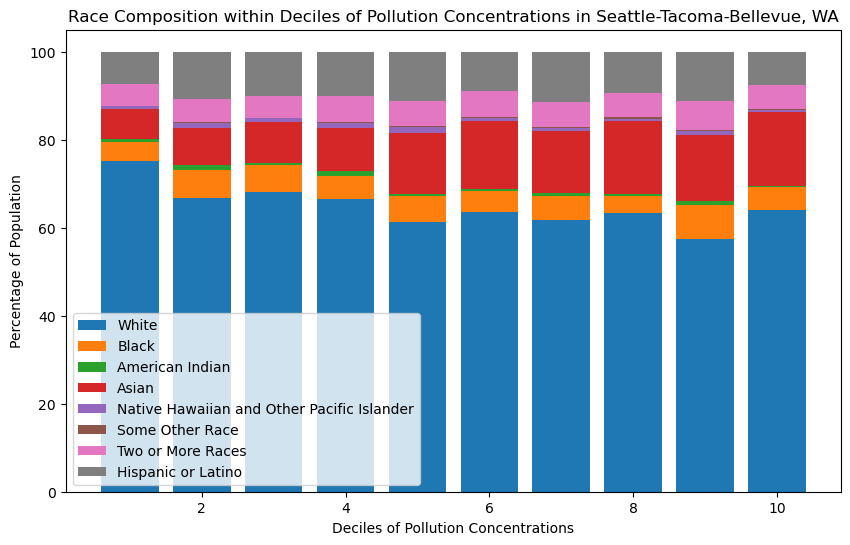

In [54]:


box_whisker(rwc_census_tract_pm25, location = "Seattle-Tacoma-Bellevue, WA", col = "2016_per_a")
box_whisker(rwc_census_tract_pm25, location = "Seattle-Tacoma-Bellevue, WA", col = "2020_new_p")

decile_plot(rwc_census_tract_pm25,      loc = "Seattle-Tacoma-Bellevue, WA",  col = "2016_per_a")
decile_plot(rwc_census_tract_pm25,      loc = "Seattle-Tacoma-Bellevue, WA",  col = "2020_new_p")